In [1]:
import os
import sys
from pathlib import Path

import anndata as ad
import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from joblib import Parallel, delayed
from matplotlib.pyplot import rc_context
from skimage import exposure, io
from skimage.util import img_as_ubyte
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.notebook import tqdm, trange
from matplotlib.patches import Patch
from skimage.transform import rescale, resize

sc.settings.verbosity = 3

In [2]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [3]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

In [4]:
experiment = "Lung"
cores = ['B5', 'C6', 'D4', 'E4', 'E6', 'F4']
datasets = [f'{core}_{i}' for core in cores for i in range(1,5)] + ['F7_3', 'F7_4']


In [5]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Load data

In [6]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [7]:
def read_props(dataset, experiment):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{experiment}_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{experiment}_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{experiment}_{dataset}_auto.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [8]:
adatas = []
df_sums = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(dataset, experiment)
        print(f'Sucessfully read dataset {dataset}') 
    except:
        print(f'{dataset} cannot be read') 
        continue
    try:
        df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    except:
        pass
    df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
        df_morph["area"], axis=0
    )
    data_all = df_intensity_TS.iloc[:, 1:].values
    # data_all_norm = (data_all+0.1)/(np.percentile(data_all,50,axis=1,keepdims=True)+0.1)
    # data_all_norm = MinMaxScaler().fit_transform(data_all)
    # df_intensity_TS.iloc[:, 1:] = data_all_norm
    
    # Merge TS and IMC data
    df = df_intensity_TS
    df.set_index("Id", inplace=True)
    df_sums.append(df.sum(axis=0))
    
    # Put to adata format
    adata = sc.AnnData(df.values)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset
    adata.obs["Core"] = dataset.split("_")[0]
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    sc.pp.normalize_total(adata, target_sum=1e5)
    # sc.pp.log1p(adata)
    # sc.pp.scale(adata)
    adatas.append(adata)
adata = ad.concat(adatas, join="inner")

Sucessfully read dataset B5_1
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset B5_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset B5_3
normalizing counts per cell
    finished (0:00:00)
B5_4 cannot be read
Sucessfully read dataset C6_1
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset C6_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset C6_3
normalizing counts per cell
    finished ({time_passed})
Sucessfully read dataset C6_4
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset D4_1
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset D4_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset D4_3
normalizing counts per cell
    finished (0:00:00)
D4_4 cannot be read
Sucessfully read dataset E4_1
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset E4_2
normalizing counts per cell
    f

In [9]:
# Read Protein clustering info
path = data_dir / "adata" / f"{experiment}.h5ad"
adata_IMC_cluster = ad.read_h5ad(path)


In [10]:
adata = adata[~adata.obs.Dataset.isin(['F7_1', 'F7_2'])]
adata_IMC_cluster = adata_IMC_cluster[~adata_IMC_cluster.obs.Dataset.isin(['F7_1', 'F7_2'])]

In [11]:
df_sum = pd.concat(df_sums, axis=1).mean(axis=1)
mz_qc = df_sum[(df_sum > 32000)].index.tolist()

In [12]:
len(mz_qc)

146

In [13]:
adata = adata[:, mz_qc]

In [14]:
adata

View of AnnData object with n_obs × n_vars = 19507 × 146
    obs: 'Cell', 'Dataset', 'Core'
    obsm: 'spatial'

## Get literature lut

In [15]:
SIMS_masses = adata.var_names

In [16]:
# Read litterature lut
file_path = data_dir / "metadata" / 'Putative_annotation_09012022.xlsx'
df = pd.read_excel(file_path)
lum = df['m/z'].to_numpy()

# get matched table by looking at difference with error
error = 0.4
matched_dfs = []
for mz in SIMS_masses.astype(float):
    if mz < 1.1:
        continue
    diff = lum-mz
    matched = df[abs(diff)<error]
    if len(matched) > 0:
        matched.loc[:,'SIMS mz'] = mz
        matched_dfs.append(matched)
    else:
        matched = pd.DataFrame([['', '', '', '', mz]], columns=df.columns.tolist() + ['SIMS mz'])
        matched_dfs.append(matched)
matched = pd.concat(matched_dfs)

In [17]:
# Get all info from litterature excel
SIMS_masses_subset = np.array(matched['SIMS mz'].to_list(), dtype=float).astype(str)
SIMS_masses_subset = pd.Index(SIMS_masses_subset)

SIMS_name_subset = np.array(matched['Molecules'].to_list()).astype(str)
SIMS_name_subset = pd.Index(SIMS_name_subset)

SIMS_nm_subset = SIMS_masses_subset + 'm/z ' + SIMS_name_subset

SIMS_type_subset = np.array(matched['Type'].to_list()).astype(str)
SIMS_type_subset = pd.Index(SIMS_type_subset)

print(f"Number of matched m/z: {len(SIMS_masses_subset)}")

Number of matched m/z: 145


In [18]:
adata_all = adata.copy()
adata = adata[:, SIMS_masses_subset]
adata.var_names = SIMS_nm_subset

# Rename clusters

In [19]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [20]:
adata_CN = adata_IMC_cluster.copy()

In [21]:
adata_CN[:,'CD31']

View of AnnData object with n_obs × n_vars = 19507 × 1
    obs: 'Cell', 'Dataset', 'Core', 'leiden'
    var: 'mean', 'std'
    uns: 'Dataset_colors', 'dendrogram_leiden', 'leiden', 'neighbors', 'umap'
    obsm: 'Scanorama', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

# Plot CD31 intensity

In [22]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_cell_intensity(mask, label2cell, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan

    for cells, intensity in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols] = intensity

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [23]:
experiment='Lung'

In [24]:
masks = get_masks(data_dir / "masks", f"{experiment}")

  0%|          | 0/937 [00:00<?, ?it/s]

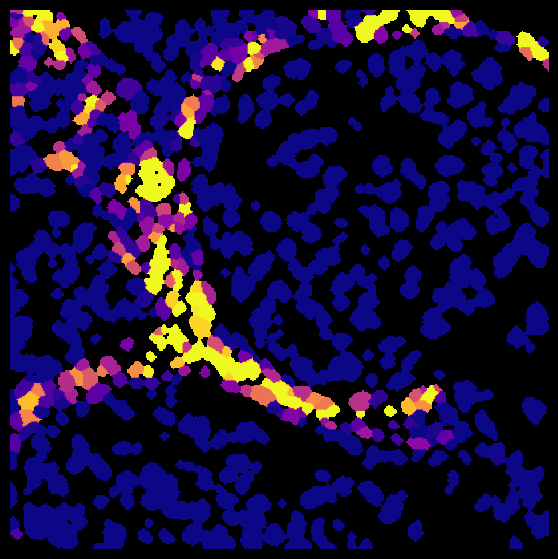

  0%|          | 0/960 [00:00<?, ?it/s]

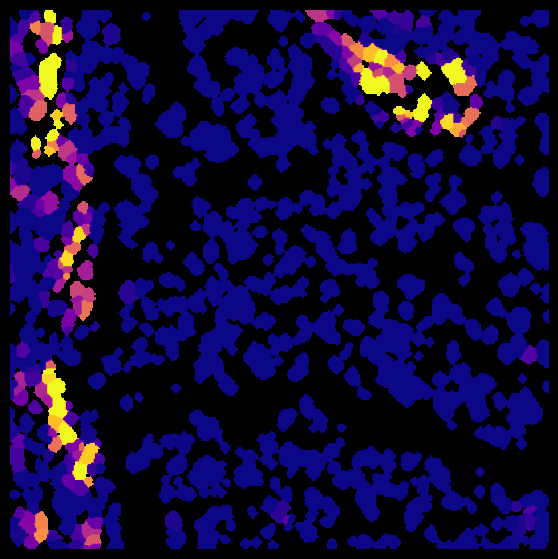

  0%|          | 0/993 [00:00<?, ?it/s]

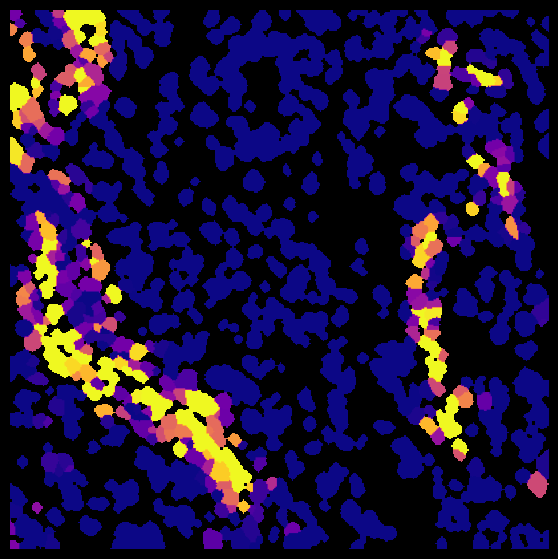

  0%|          | 0/905 [00:00<?, ?it/s]

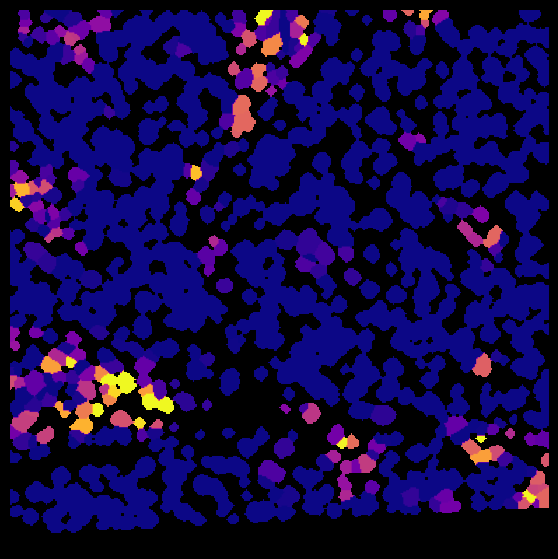

  0%|          | 0/970 [00:00<?, ?it/s]

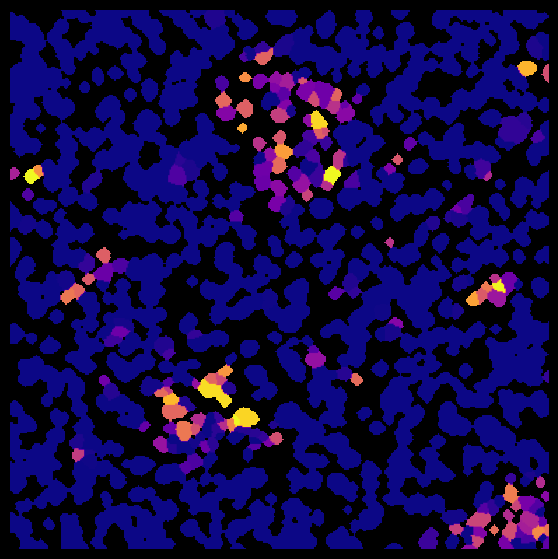

  0%|          | 0/1282 [00:00<?, ?it/s]

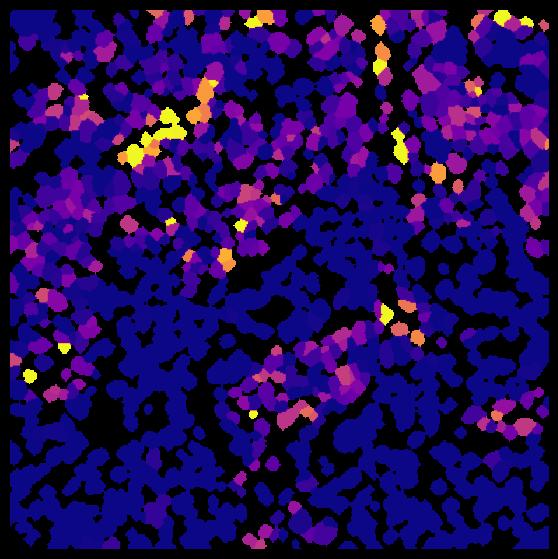

  0%|          | 0/866 [00:00<?, ?it/s]

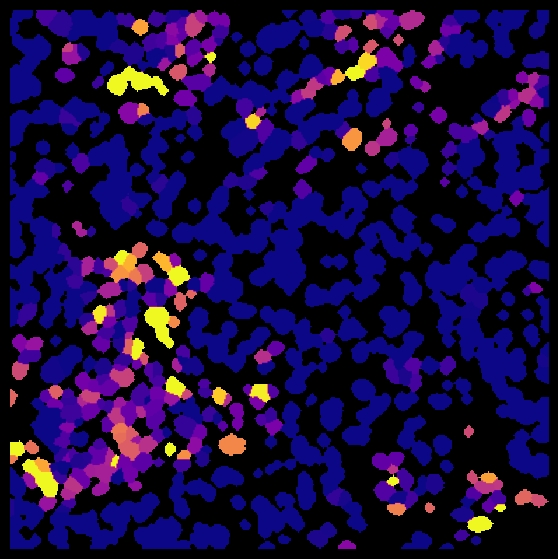

  0%|          | 0/948 [00:00<?, ?it/s]

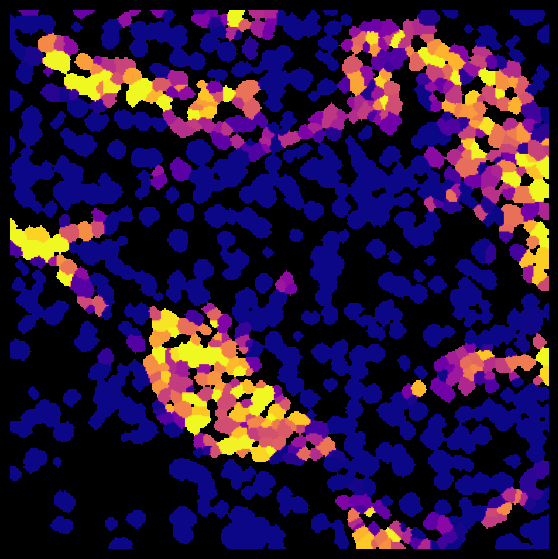

  0%|          | 0/1117 [00:00<?, ?it/s]

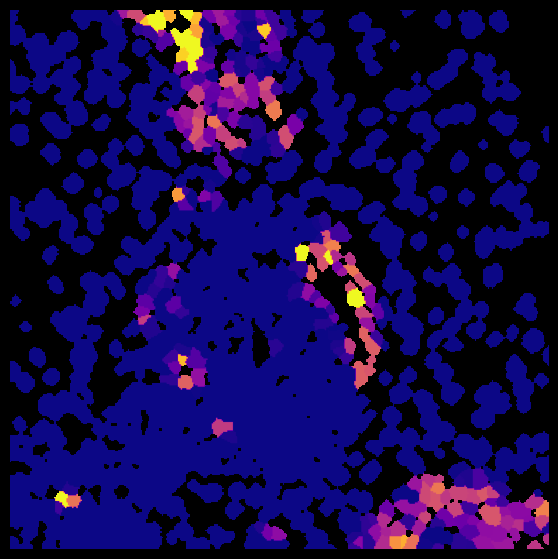

  0%|          | 0/456 [00:00<?, ?it/s]

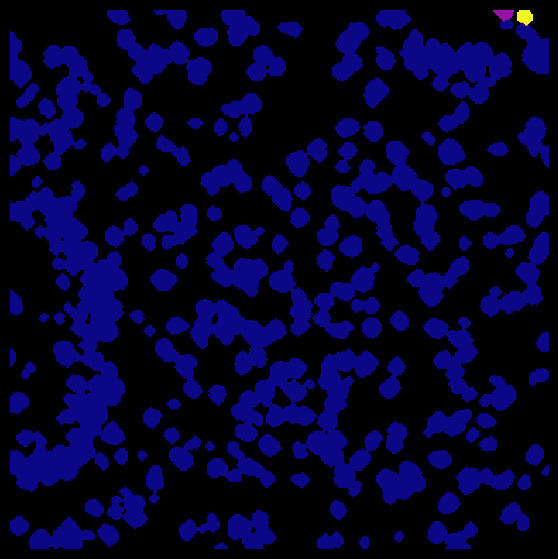

  0%|          | 0/738 [00:00<?, ?it/s]

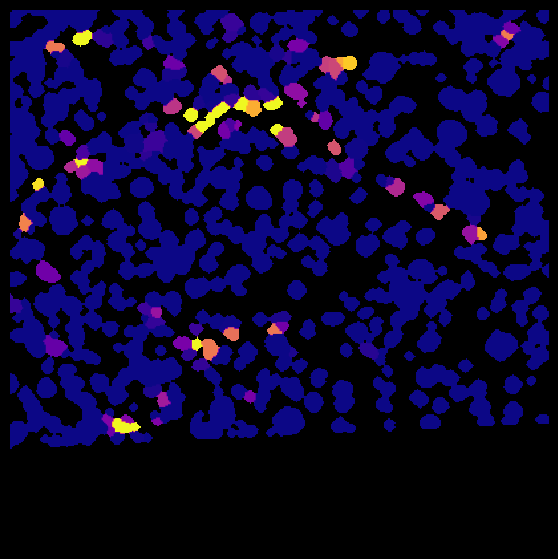

  0%|          | 0/931 [00:00<?, ?it/s]

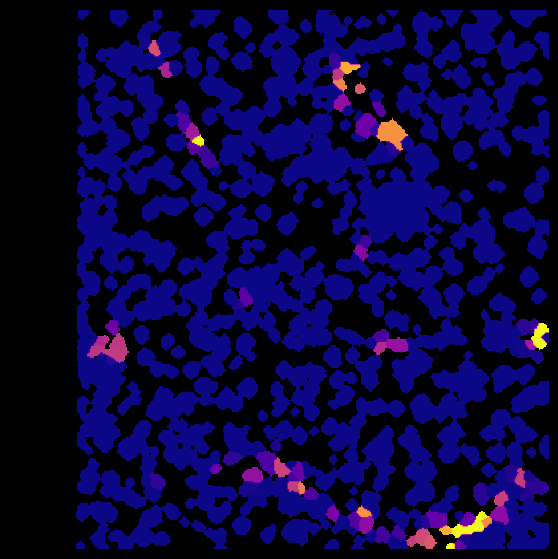

  0%|          | 0/1293 [00:00<?, ?it/s]

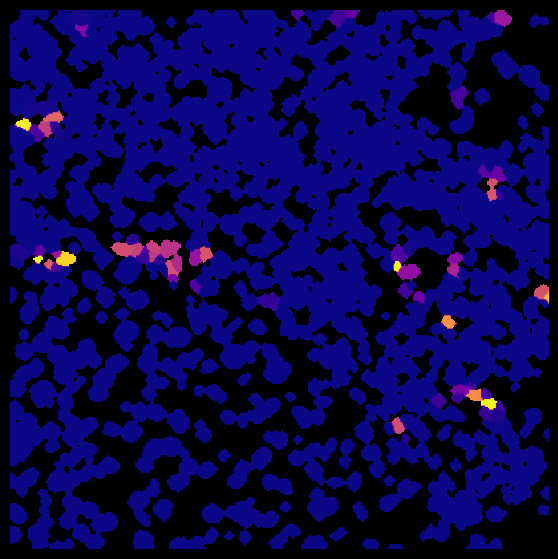

  0%|          | 0/1209 [00:00<?, ?it/s]

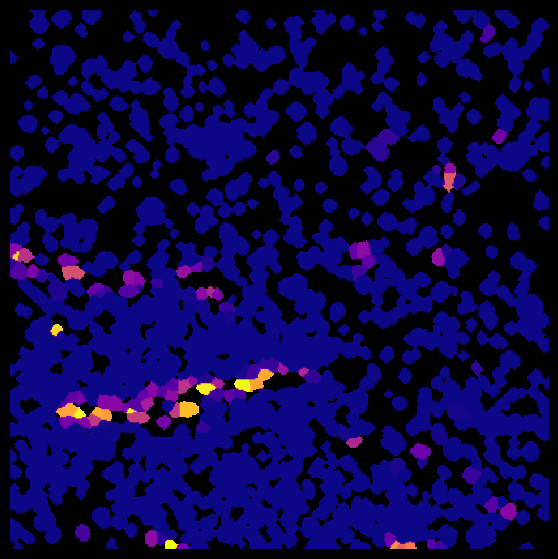

  0%|          | 0/533 [00:00<?, ?it/s]

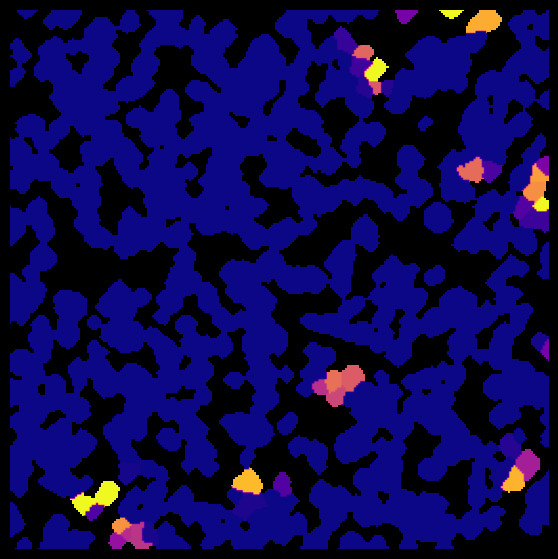

  0%|          | 0/415 [00:00<?, ?it/s]

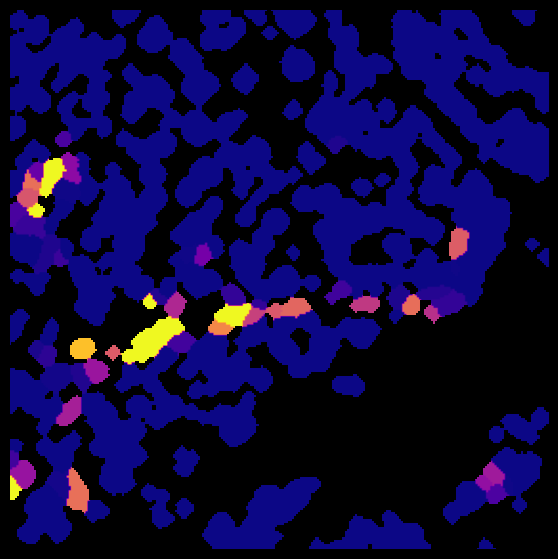

  0%|          | 0/474 [00:00<?, ?it/s]

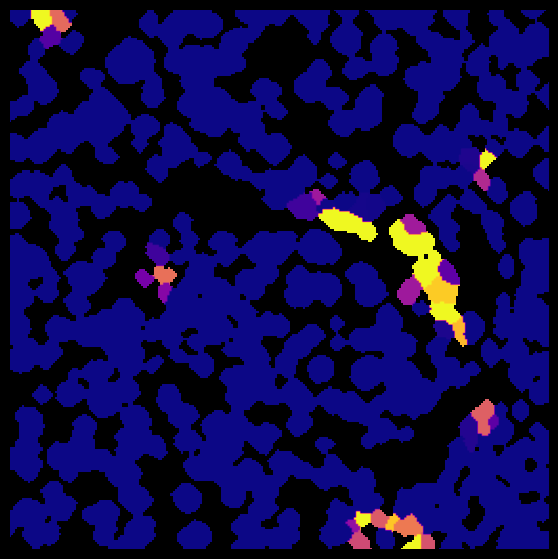

  0%|          | 0/1072 [00:00<?, ?it/s]

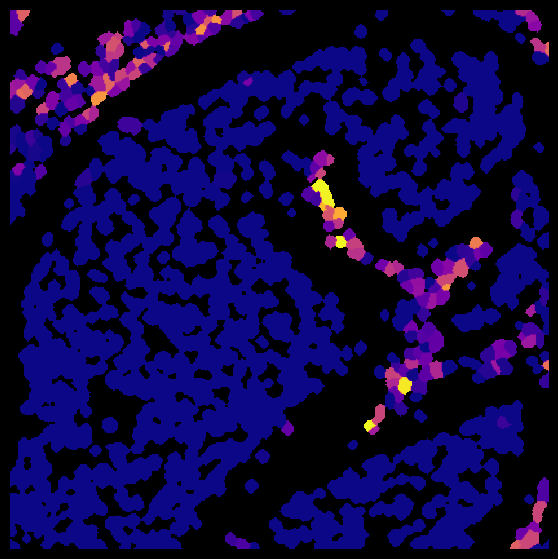

  0%|          | 0/1180 [00:00<?, ?it/s]

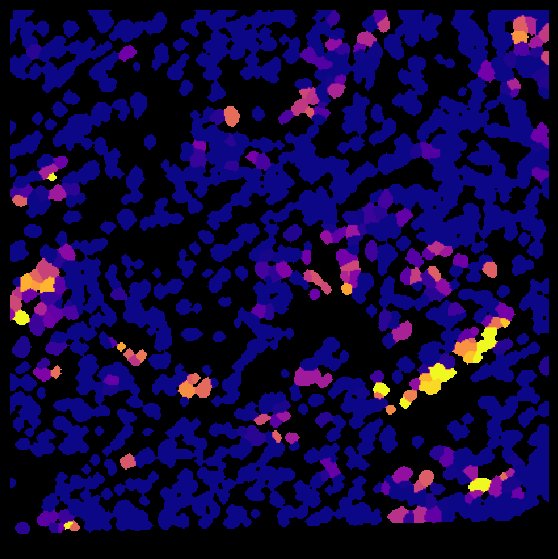

  0%|          | 0/1133 [00:00<?, ?it/s]

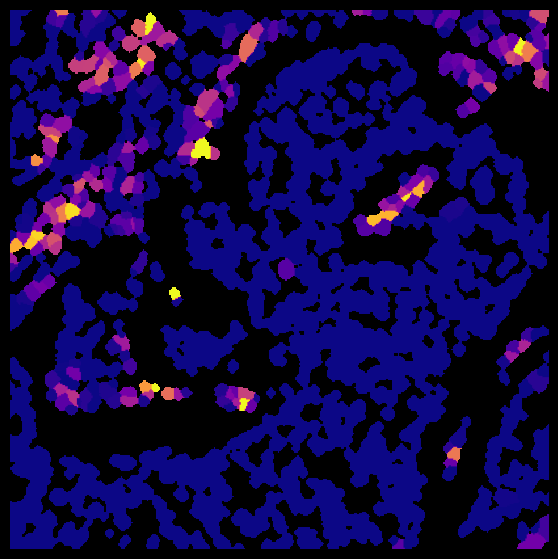

  0%|          | 0/450 [00:00<?, ?it/s]

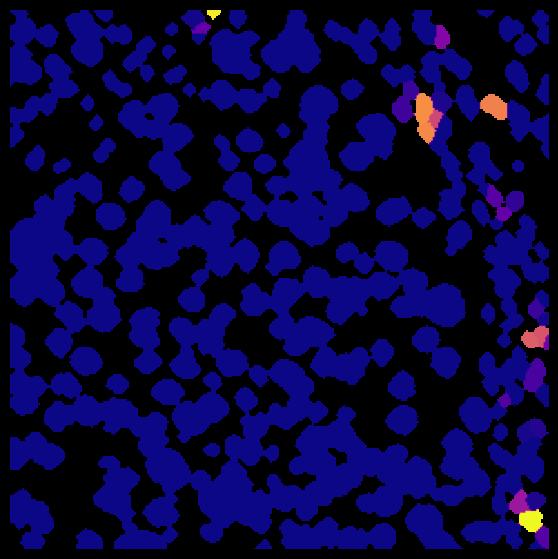

  0%|          | 0/645 [00:00<?, ?it/s]

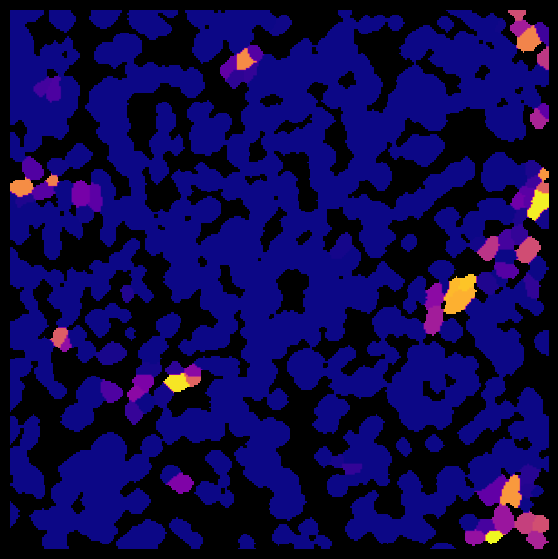

In [25]:
for dataset in adata_CN.obs['Dataset'].unique():
    adata_fov = adata_CN[adata_CN.obs['Dataset'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    cell_ids = adata_fov.obs.Cell.to_list()
    intensities = adata_fov[:,'CD31'].X.flatten()
    
    for i, cell in enumerate(cell_ids):
        label2cell[cell] = intensities[i]

    img = create_cell_intensity(mask, label2cell)

    fig, ax = plt.subplots(figsize=(7, 7), facecolor='k')
    ax.imshow(img, cmap='plasma', vmin=np.nanquantile(img, 0.2))
    ax.axis("off")
    plt.show()

# Distance to CD31 positif

In [26]:
from sklearn.neighbors import NearestNeighbors

def get_distance(adata, adata_ref, n=1):
    data_ref = adata_ref.obsm["spatial"]
    data = adata.obsm["spatial"]
    fit = NearestNeighbors(n_neighbors=n ).fit(data_ref)
    m = fit.kneighbors(data)
    m = m[0], m[1] # Distances, Indices

    return m[0]


  0%|          | 0/937 [00:00<?, ?it/s]

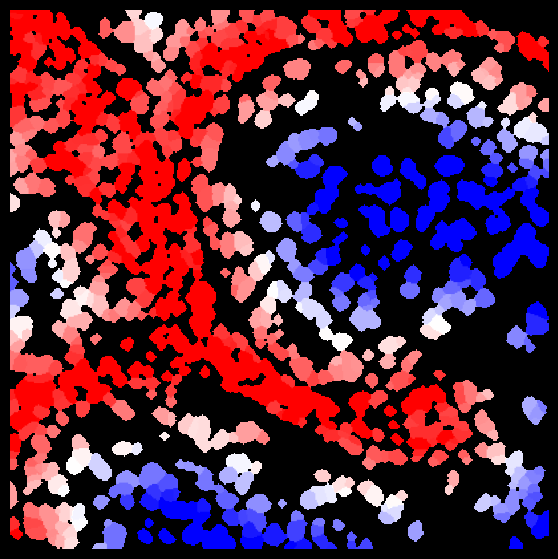

  0%|          | 0/960 [00:00<?, ?it/s]

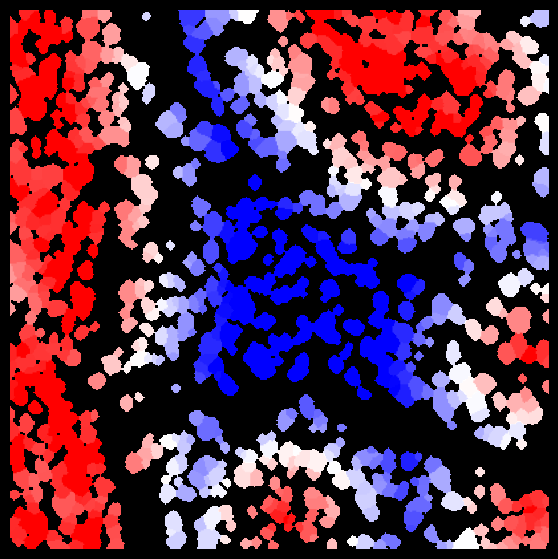

  0%|          | 0/993 [00:00<?, ?it/s]

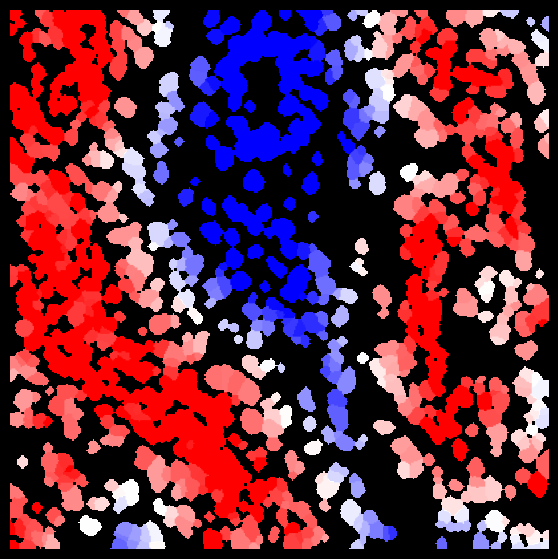

  0%|          | 0/905 [00:00<?, ?it/s]

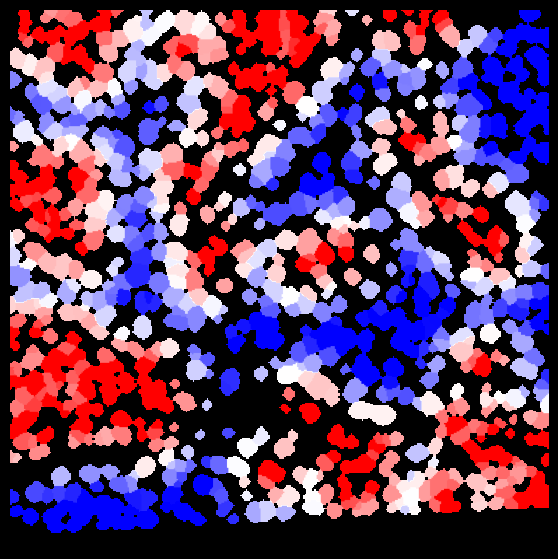

  0%|          | 0/970 [00:00<?, ?it/s]

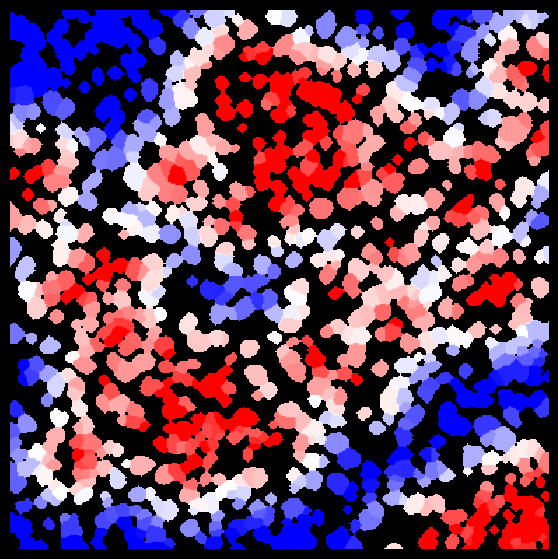

  0%|          | 0/1282 [00:00<?, ?it/s]

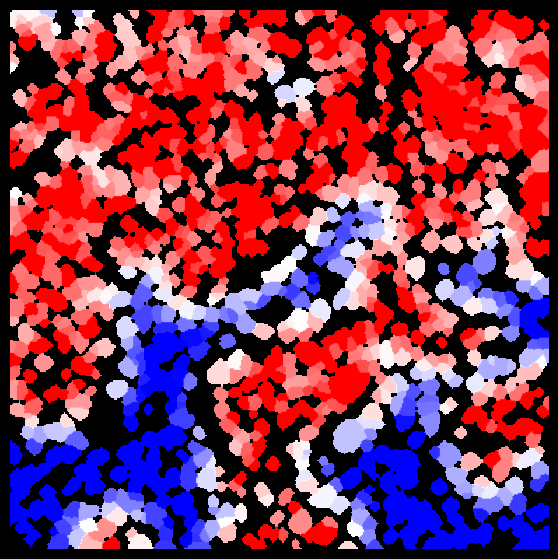

  0%|          | 0/866 [00:00<?, ?it/s]

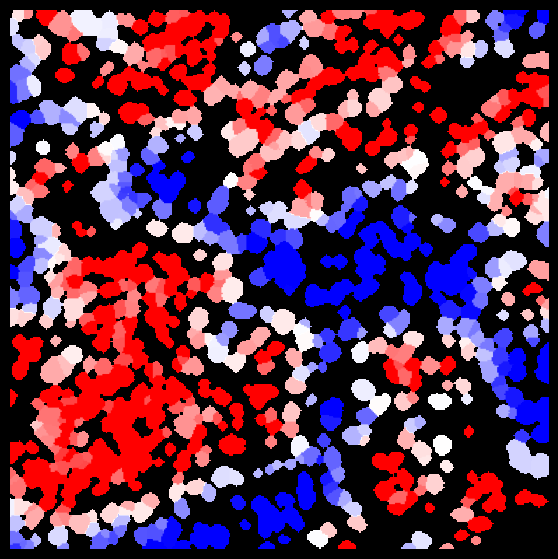

  0%|          | 0/948 [00:00<?, ?it/s]

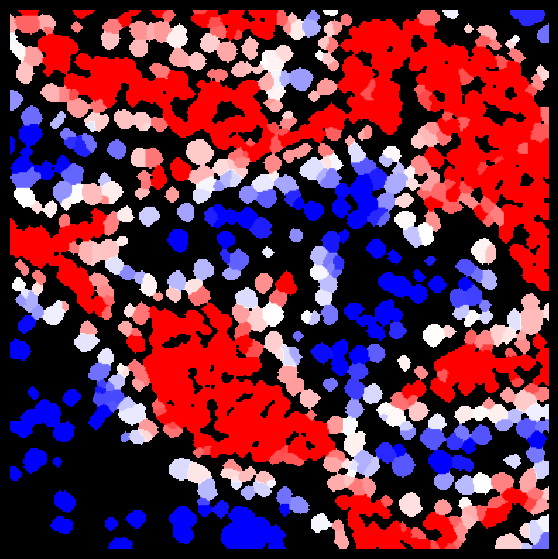

  0%|          | 0/1117 [00:00<?, ?it/s]

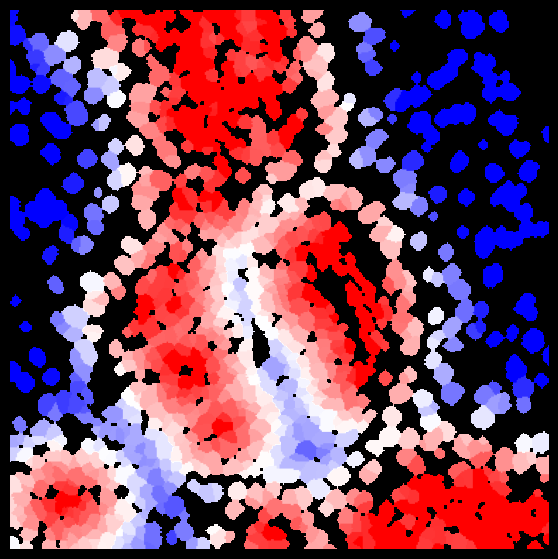

  0%|          | 0/738 [00:00<?, ?it/s]

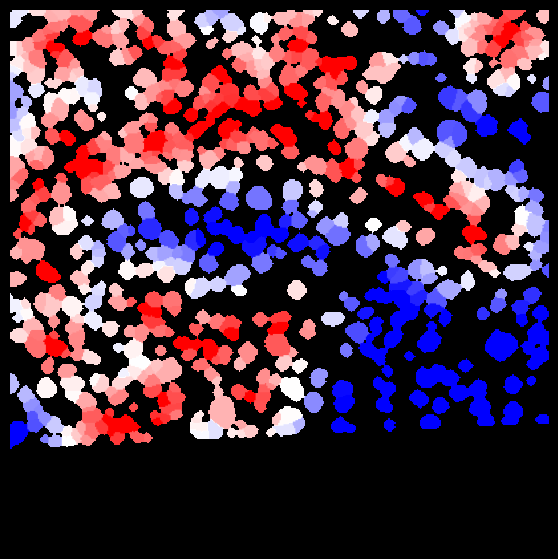

  0%|          | 0/931 [00:00<?, ?it/s]

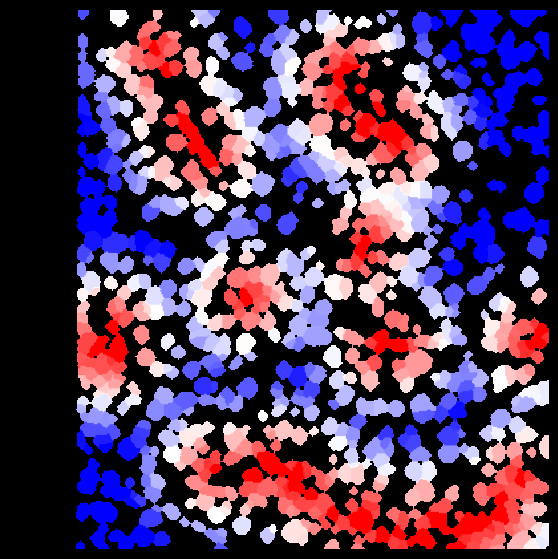

  0%|          | 0/1293 [00:00<?, ?it/s]

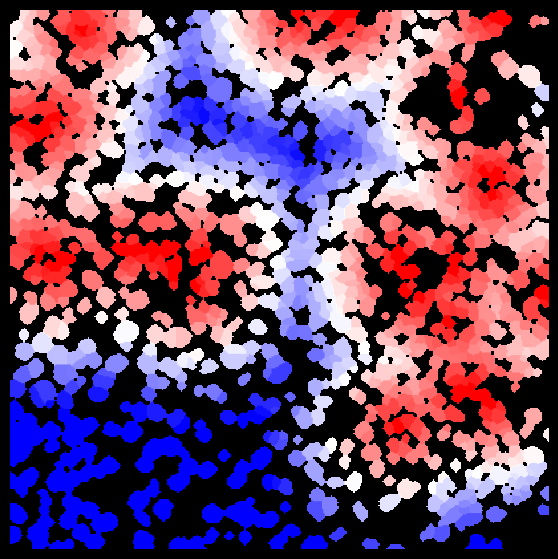

  0%|          | 0/1209 [00:00<?, ?it/s]

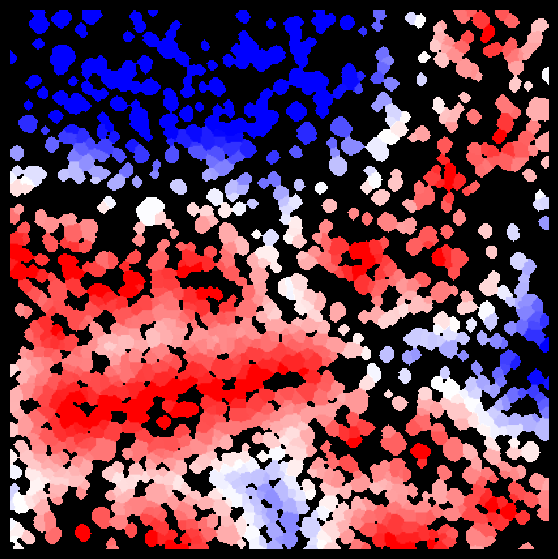

  0%|          | 0/533 [00:00<?, ?it/s]

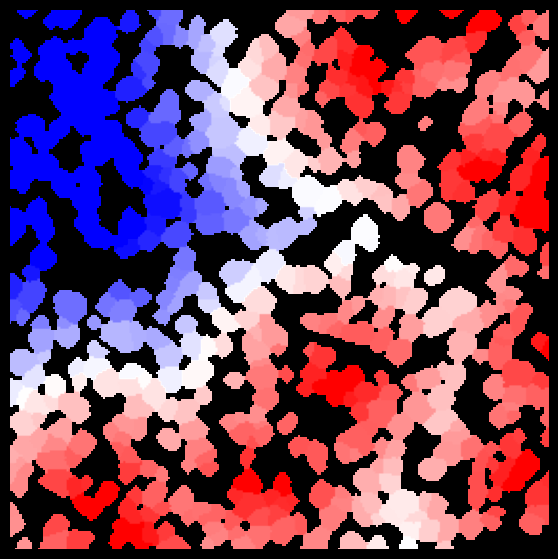

  0%|          | 0/415 [00:00<?, ?it/s]

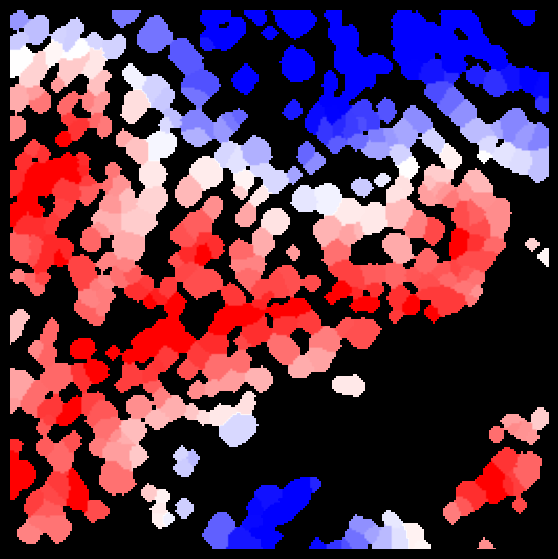

  0%|          | 0/474 [00:00<?, ?it/s]

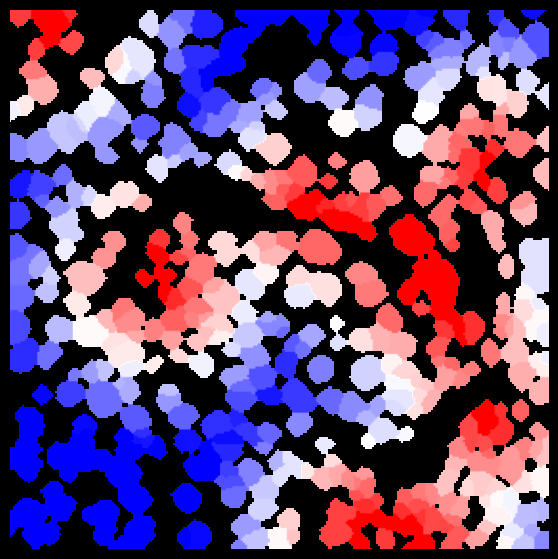

  0%|          | 0/1072 [00:00<?, ?it/s]

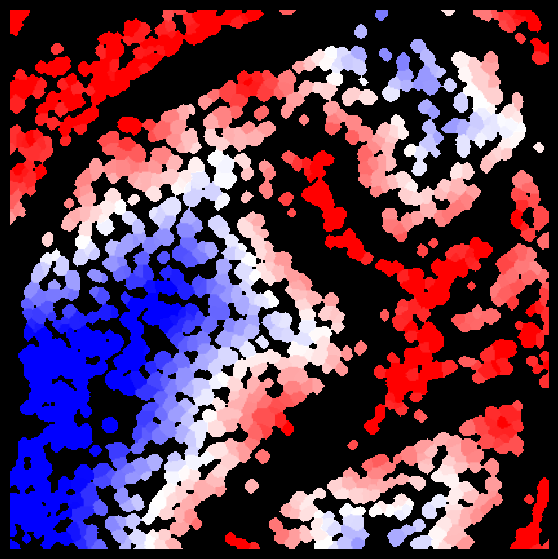

  0%|          | 0/1180 [00:00<?, ?it/s]

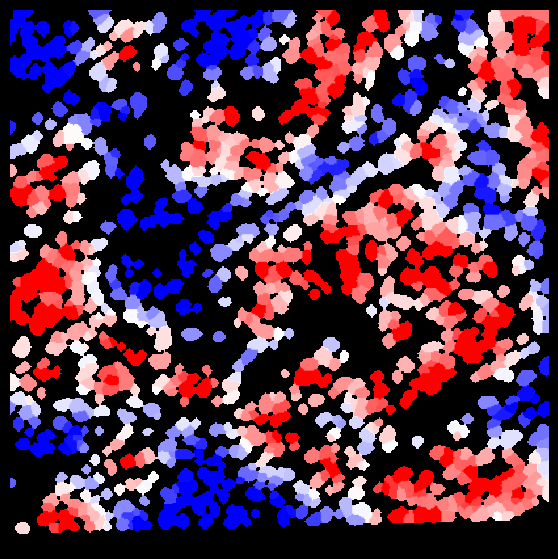

  0%|          | 0/1133 [00:00<?, ?it/s]

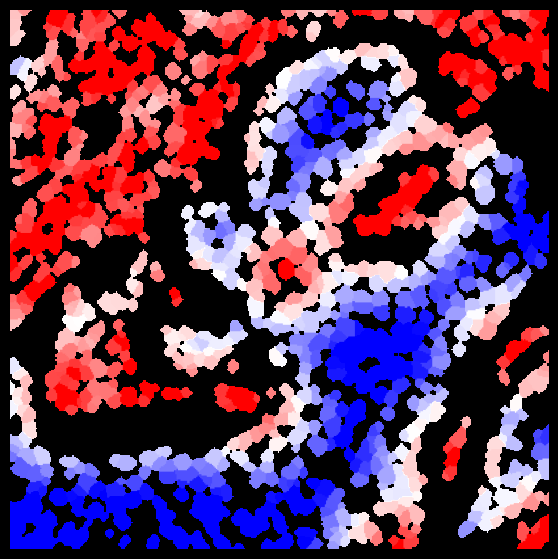

  0%|          | 0/450 [00:00<?, ?it/s]

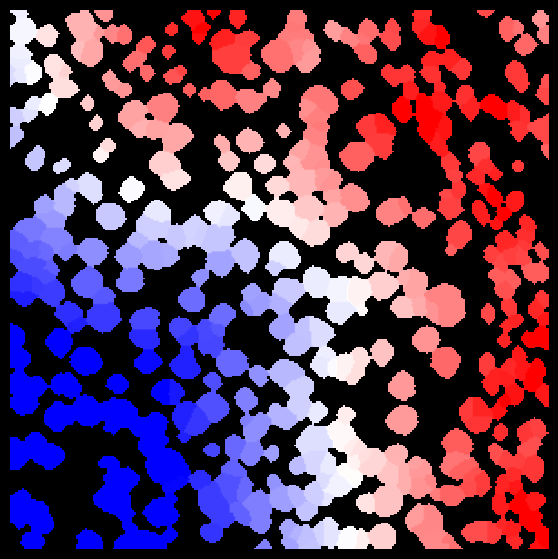

  0%|          | 0/645 [00:00<?, ?it/s]

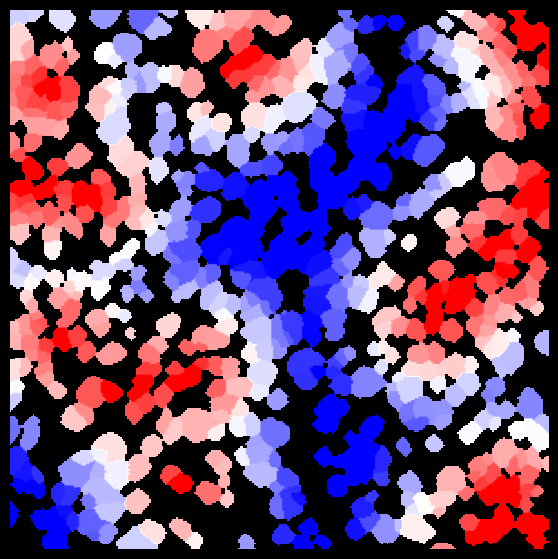

In [27]:
for dataset in adata_CN.obs['Dataset'].unique():
    adata_fov = adata_CN[adata_CN.obs['Dataset'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
    
    adata_ref = adata_fov[adata_fov[:,'CD31'].X > 0.05]
    if len(adata_ref) < 10:
        continue
    
    d = get_distance(adata_fov, adata_ref)
    label2cell = {}
    cell_ids = adata_fov.obs.Cell.to_list()

    for i, cell in enumerate(cell_ids):
        label2cell[cell] = d[i]

    img = create_cell_intensity(mask, label2cell)

    fig, ax = plt.subplots(figsize=(7, 7), facecolor='k')
    ax.imshow(img, cmap='bwr_r', vmax=np.nanquantile(img, 0.9))
    ax.axis("off")
    plt.show()


# Distance analysis

In [105]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

In [106]:
distances = []
adatas = []
adatas_SIMS = []
scaler = StandardScaler()

for dataset in adata_CN.obs['Dataset'].unique():
    adata_fov = adata_CN[adata_CN.obs['Dataset'] == dataset]
    adata_fov_sims = adata[adata.obs['Dataset'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
    
    adata_ref = adata_fov[adata_fov[:,'CD31'].X > 0.05]
    if len(adata_ref) < 10:
        continue
    
    
    d = get_distance(adata_fov, adata_ref)
    d = scaler.fit_transform(d)
    d = d.flatten()
    
    distances.append(d)
    adatas.append(adata_fov)
    adatas_SIMS.append(adata_fov_sims)

In [107]:
distance = np.concatenate(distances)
adata_distance = ad.concat(adatas_SIMS)

df = pd.DataFrame(adata_distance.X, columns=adata_distance.var_names.tolist())
df['Proximity to CD31'] = -distance
df_corr = df.corr()


In [108]:
n = 8
marker = 'Proximity to CD31'
n_cut = 25

# Get positive and negative correlation
corr_pos = df_corr.loc[marker].nlargest(25).index.tolist()
corr_neg = df_corr.loc[marker].nsmallest(25).index.tolist()

# Get only SIMS masses
corr_pos = [corr for corr in corr_pos if corr in SIMS_nm_subset][:n]
corr_neg = [corr for corr in corr_neg if corr in SIMS_nm_subset][:n]
corr_list = [marker] + corr_pos + corr_neg

# Get range 
df_intensity = df[corr_list]
df_intensity.sort_values(by=[marker], inplace=True)
df_intensity[f'{marker} cut'] = pd.qcut(df_intensity[marker], n_cut, duplicates='drop') 

LE = LabelEncoder()
df_intensity[f'{marker} cut'] = LE.fit_transform(df_intensity[f'{marker} cut'])

In [109]:
df_sort = df_intensity.groupby('Proximity to CD31 cut').mean()

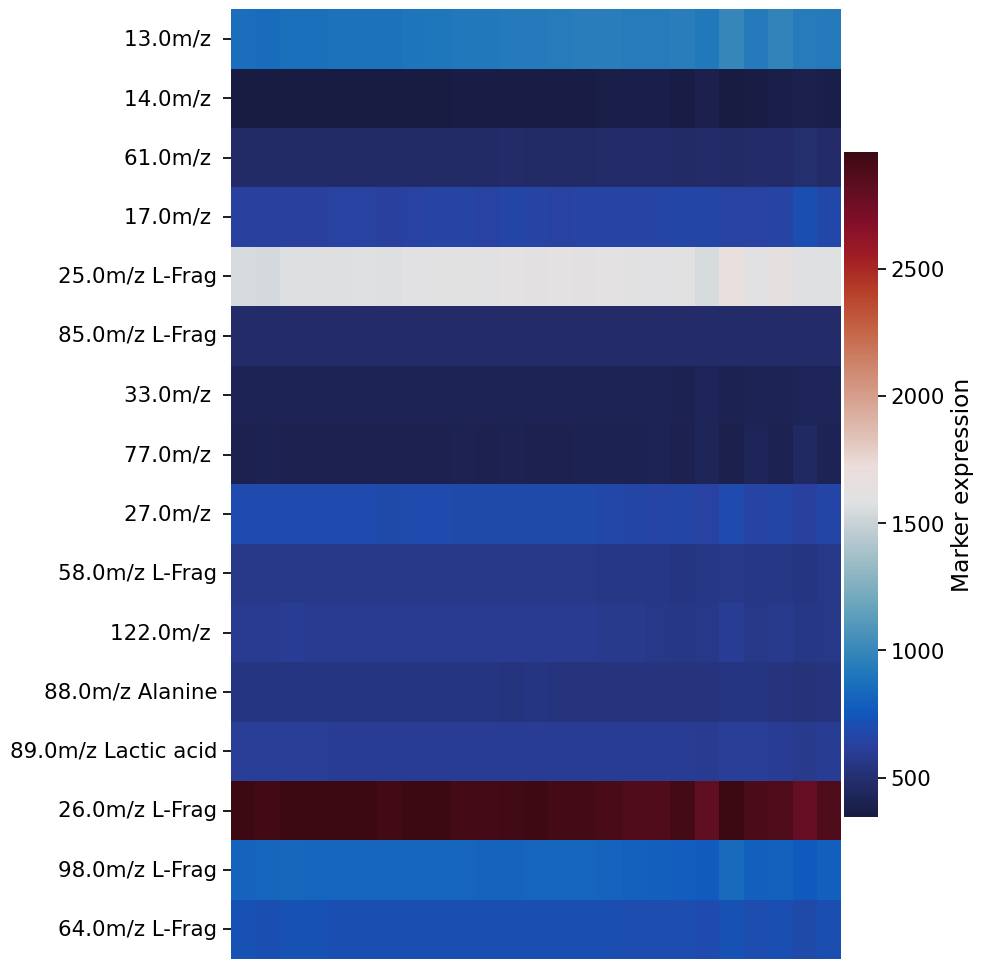

In [112]:
with sns.plotting_context('notebook', font_scale=1.4):
    fig, ax = plt.subplots(figsize=(10,10))
    ax = sns.heatmap(df_sort.T.iloc[1:,:], ax=ax, cmap=heatmap_cmp,
                     xticklabels=False, yticklabels=True, 
                     cbar_kws={"label": "Marker expression", "pad": 0.004, "shrink": 0.7})
    ax.set(xlabel='')
    plt.tight_layout()
    plt.show()

# Competition

In [34]:
# Read Protein clustering info
path = data_dir / "adata" / f"{experiment}_R.h5ad"
adata_IMC_cluster = ad.read_h5ad(path)
adata_IMC = adata_IMC_cluster[~adata_IMC_cluster.obs.Dataset.isin(['F7_1', 'F7_2'])]

In [35]:
type_dict = {'0': 'Tumor',
            '1': 'Tumor',
            '2': 'Stroma', 
            '3': 'Immune',
            '4': 'Immune',
            '5': 'Stroma',
            '6': 'Tumor'
            }

In [36]:
adata_IMC.obs['Type'] = (
    adata_IMC.obs['leiden']
    .map(type_dict)
)


In [37]:
obs = adata_IMC.obs
positif = (adata_CN[:, 'CD8' ].X > 1).flatten()
obs.loc[positif, 'Type'] = 'CD8+'

positif = (adata_CN[:, 'CD20' ].X > 1).flatten()
obs.loc[positif, 'Type'] = 'CD20+'

positif = (adata_CN[:, 'CD68' ].X > 1).flatten()
obs.loc[positif, 'Type'] = 'CD68+'
adata_IMC.obs = obs
adata_IMC.obs['Type'] = adata_IMC.obs['Type'].astype('category')

adata_IMC.uns['Type_colors'] = adata_IMC.uns['leiden_colors'][:len(np.unique(adata_IMC.obs['Type']))]

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Type']`


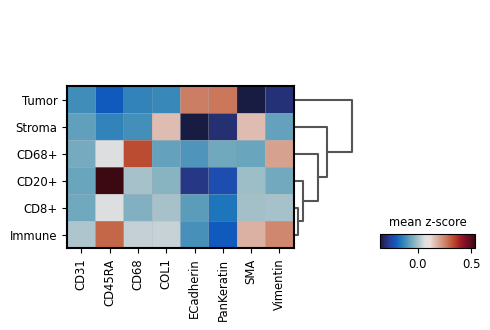

In [38]:
sc.tl.dendrogram(adata_IMC, groupby='Type')

sc.pl.matrixplot(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "Type",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap=heatmap_cmp,
    swap_axes=False,
    # vmin=-0.25,
    # vmax=0.5
)

In [39]:
cluster_label_order = adata_IMC.uns['dendrogram_Type']['categories_ordered']

In [40]:
import matplotlib 

colors = adata_IMC.uns["Type_colors"]
labels = adata_IMC.obs.Type.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

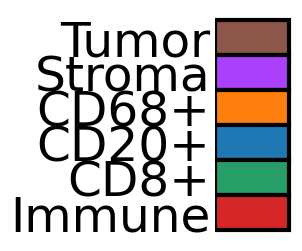

In [41]:
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

# legend
fig, ax = plt.subplots(figsize=(1,3))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=35)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


## Clustered cells

In [42]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [43]:
experiment='Lung'
masks = get_masks(data_dir / "masks", f"{experiment}")

In [44]:
group = 'Type'

colors = adata_IMC.uns[f"{group}_colors"]
labels = np.unique(adata_IMC.obs[group].tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

  0%|          | 0/6 [00:00<?, ?it/s]

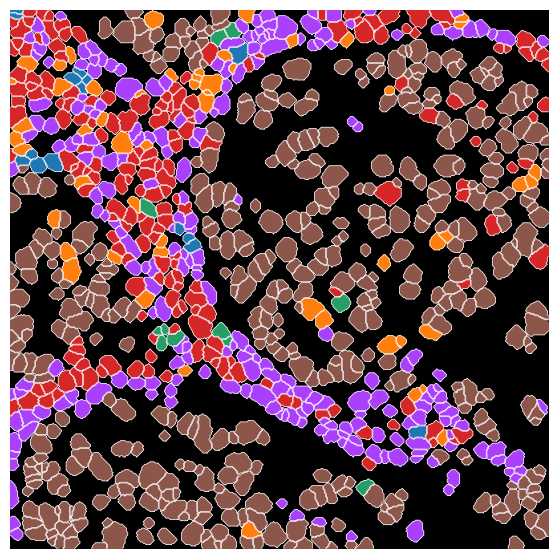

  0%|          | 0/6 [00:00<?, ?it/s]

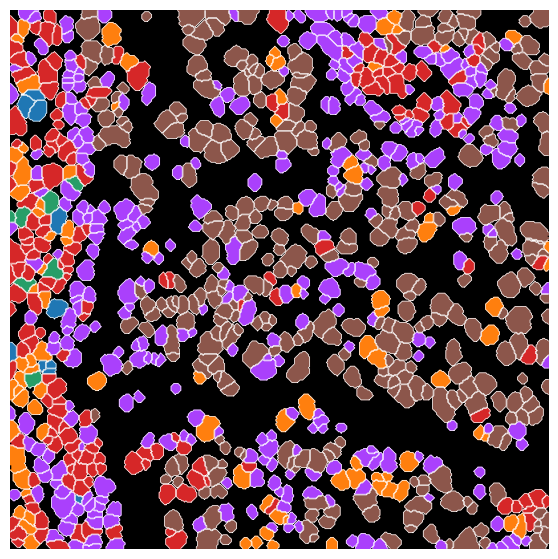

  0%|          | 0/6 [00:00<?, ?it/s]

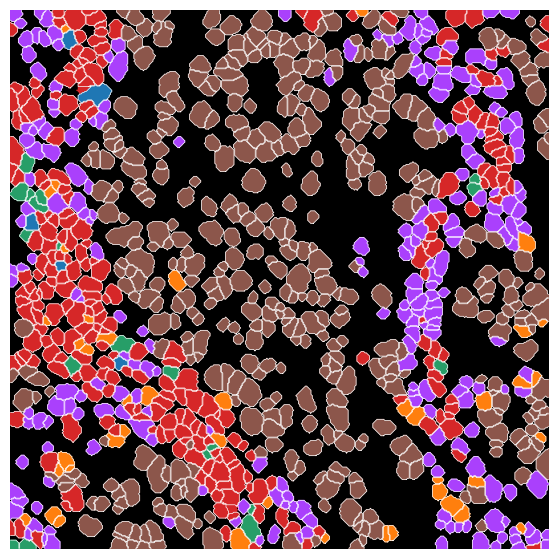

  0%|          | 0/6 [00:00<?, ?it/s]

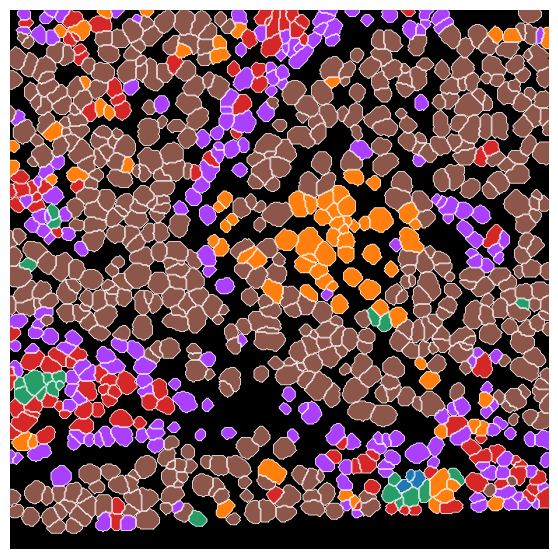

  0%|          | 0/6 [00:00<?, ?it/s]

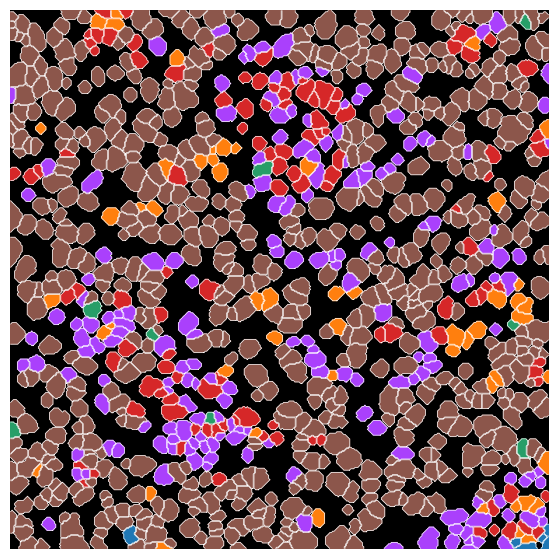

  0%|          | 0/6 [00:00<?, ?it/s]

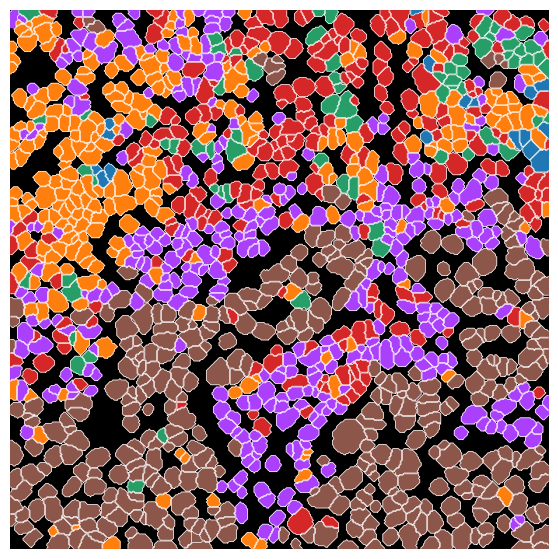

  0%|          | 0/6 [00:00<?, ?it/s]

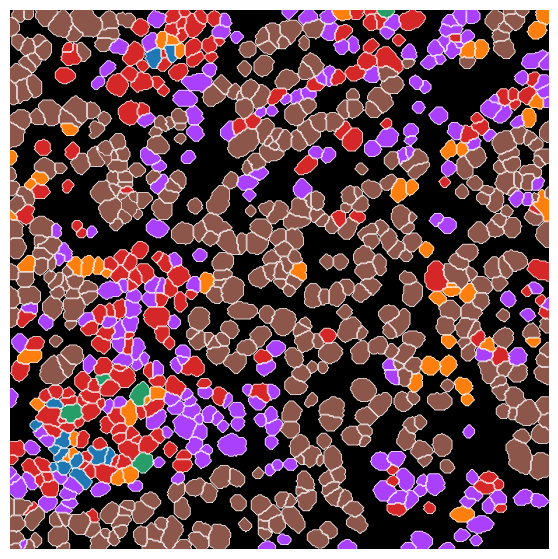

  0%|          | 0/6 [00:00<?, ?it/s]

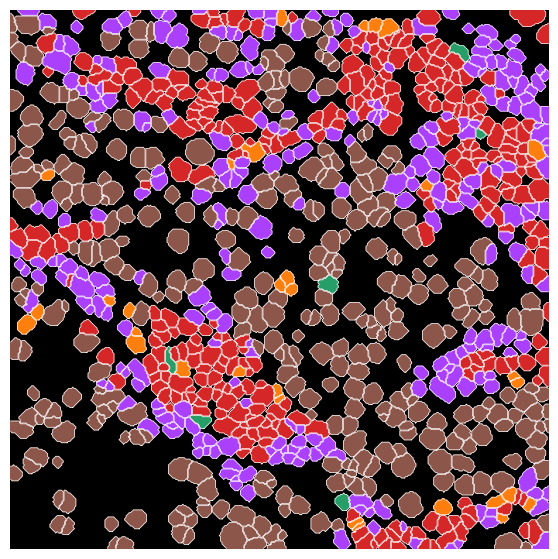

  0%|          | 0/6 [00:00<?, ?it/s]

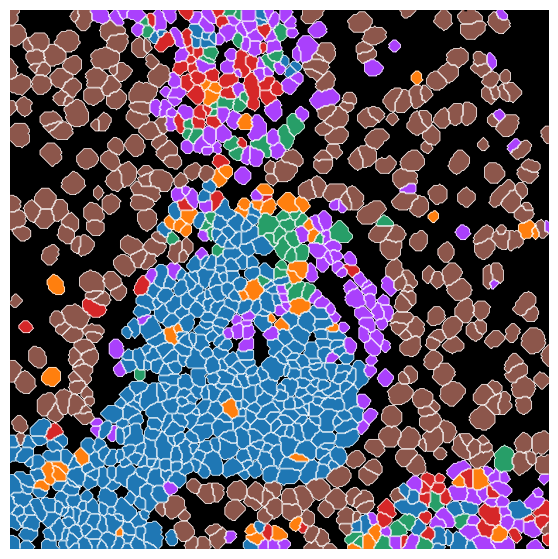

  0%|          | 0/6 [00:00<?, ?it/s]

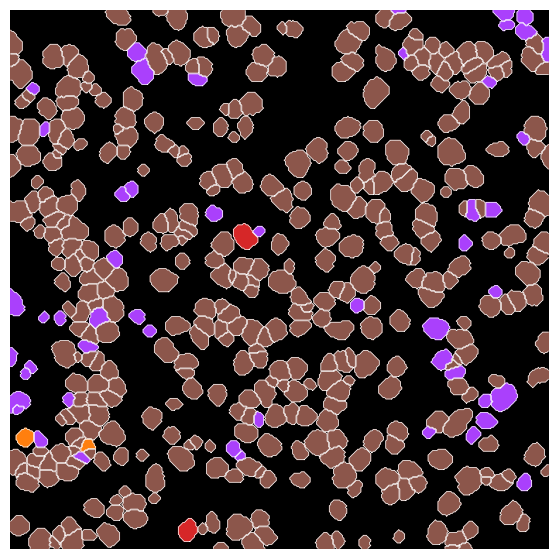

  0%|          | 0/6 [00:00<?, ?it/s]

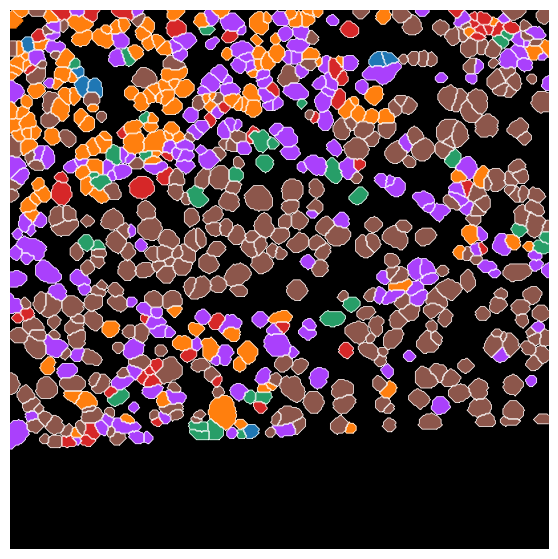

  0%|          | 0/6 [00:00<?, ?it/s]

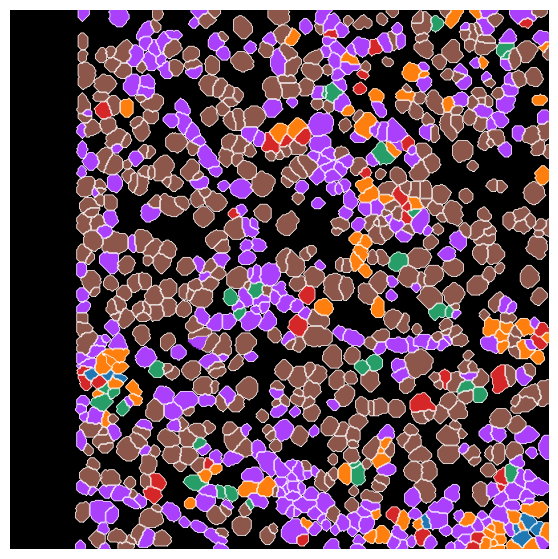

  0%|          | 0/6 [00:00<?, ?it/s]

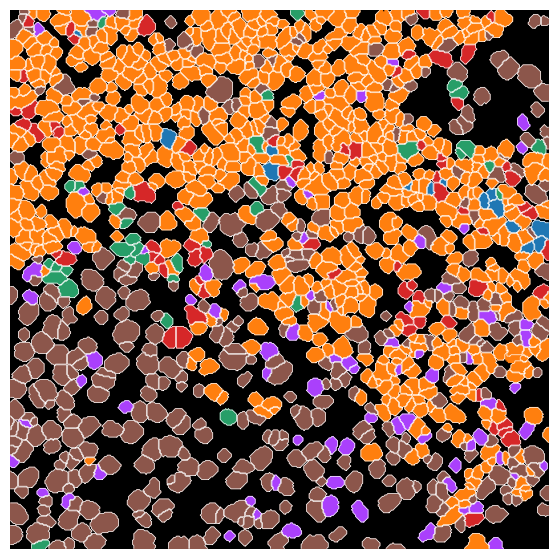

  0%|          | 0/6 [00:00<?, ?it/s]

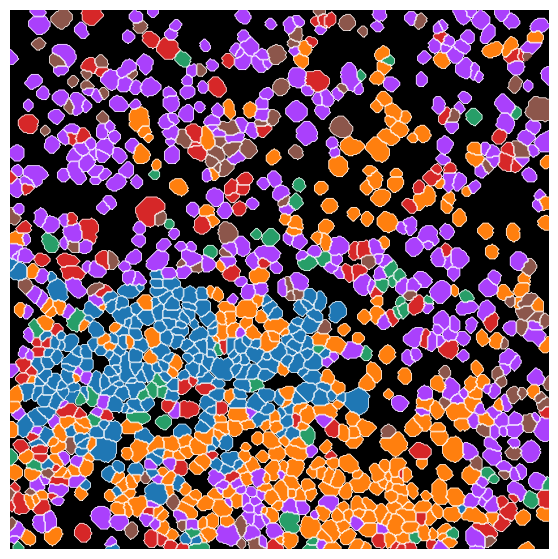

  0%|          | 0/6 [00:00<?, ?it/s]

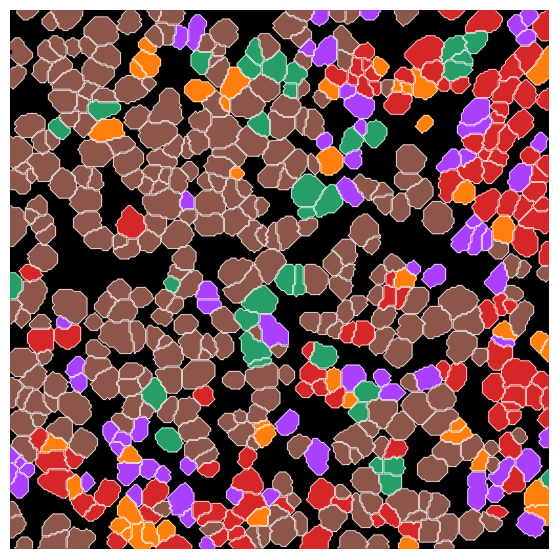

  0%|          | 0/6 [00:00<?, ?it/s]

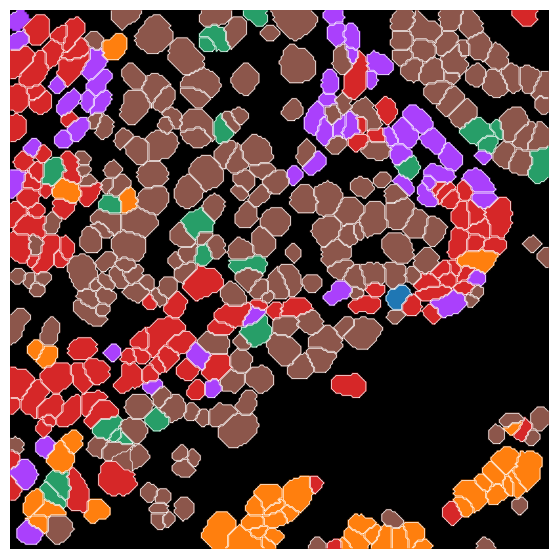

  0%|          | 0/6 [00:00<?, ?it/s]

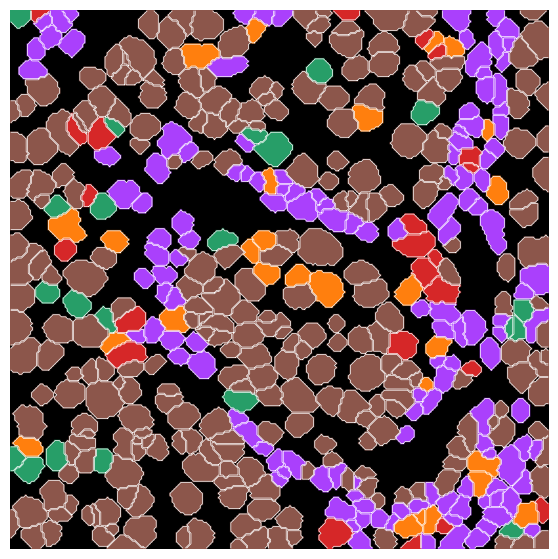

  0%|          | 0/6 [00:00<?, ?it/s]

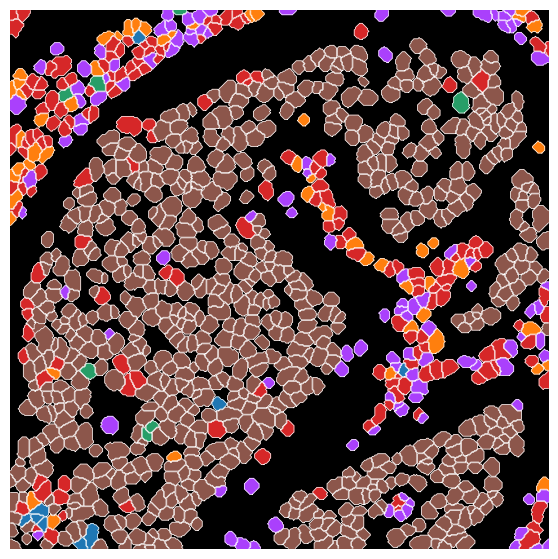

  0%|          | 0/6 [00:00<?, ?it/s]

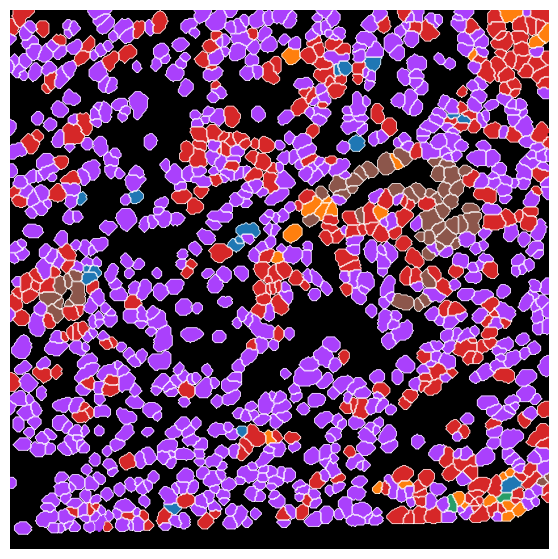

  0%|          | 0/6 [00:00<?, ?it/s]

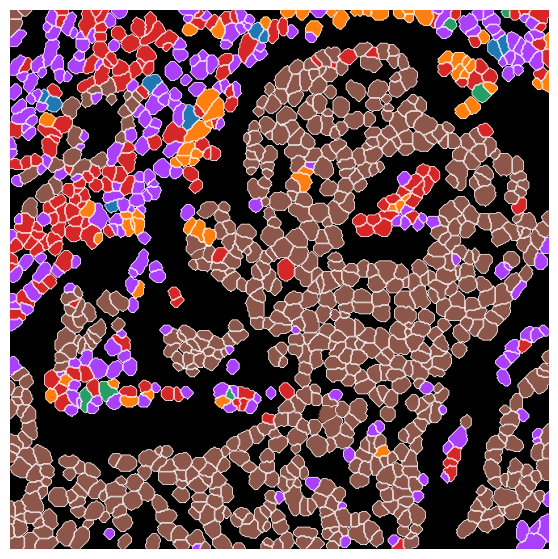

  0%|          | 0/6 [00:00<?, ?it/s]

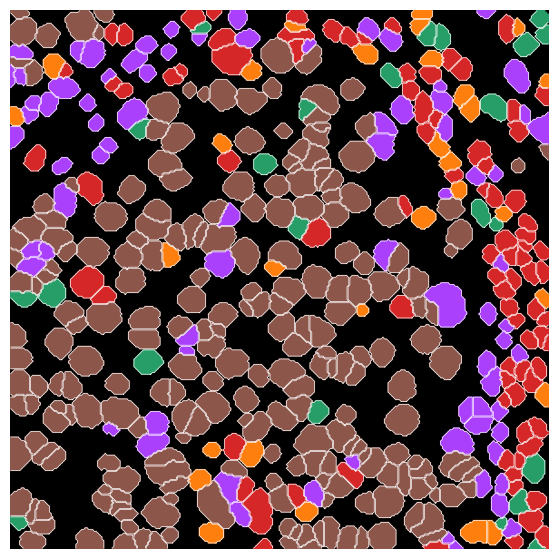

  0%|          | 0/6 [00:00<?, ?it/s]

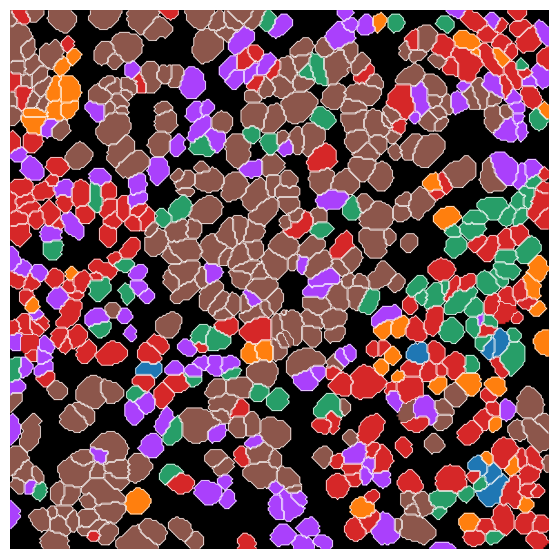

In [45]:
for dataset in adata_IMC.obs['Dataset'].unique():
    adata_fov = adata_IMC[adata_IMC.obs['Dataset'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    for i, l in enumerate(labels):
        cell_id = adata_fov[adata_fov.obs[group] == l].obs.Cell.to_list()
        label2cell[i] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()


## Create spatial omics objects

In [46]:
# import default graph builder parameters
from athena.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS
from matplotlib.colors import ListedColormap

In [47]:
import networkx as nx
import numpy as np
import pandas as pd
from typing import List
import matplotlib
import skimage
from skimage import measure

def get_node_interactions(g: nx.Graph, data: pd.Series = None):
    # NOTE: The data pd.Series is categorical with globally all categories

    source, neighs = [], []
    for i in g.nodes:
        if len(g[i]) > 0:  # some nodes might have no neighbors
            source.append(i)
            neighs.append(list(g[i]))

    node_interactions = pd.DataFrame({'source': source, 'target': neighs}).explode('target')
    if data is not None:
        node_interactions['source_label'] = data.loc[node_interactions.source].values
        node_interactions['target_label'] = data.loc[node_interactions.target].values

    return node_interactions

def get_interaction_type(node_interactions: pd.DataFrame, interaction=('GC B-cell', 'FDC')):
    
    # Get rid of source == target rows
    nint = node_interactions[~(node_interactions.source == node_interactions.target)]
    
    # Only need to look at one interaction direction A->B because B->A will be symetric
    (a1, a2) = interaction
    nint_filtered1 = nint[(nint.source_label == a1) & (nint.target_label == a2)]
    nint_filtered2 = nint[(nint.source_label == a2) & (nint.target_label == a1)]
    return pd.concat([nint_filtered1, nint_filtered2])


# Plotting
def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

# Plotting
def create_intensity_cell(mask, cell2intensity, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan

    for cell, intensity in tqdm(cell2intensity.items(), total=len(cell2intensity)):
        rows, cols = np.where(np.isin(mask, cell))
        img[rows, cols] = intensity
    return img


In [48]:
import athena as ath
from spatialOmics import SpatialOmics

spadata = SpatialOmics()
spl = pd.DataFrame({'Dataset': adata_IMC.obs.Dataset.unique()})
spadata.spl = spl

for d in adata_IMC.obs.Dataset.unique():
    adata_subset = adata_IMC[adata_IMC.obs.Dataset == d, :]
    
    obs = adata_subset.obs.copy()
    obs['x'] = adata_subset.obsm['spatial'][:,1].tolist()
    obs['y'] = adata_subset.obsm['spatial'][:,0].tolist()
    obs['cell_id'] = obs['Cell']
    obs = obs.set_index('cell_id')
    spadata.obs[d] = obs
    spadata.X[d] = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names, index=adata_subset.obs.Cell.tolist())
    spadata.var[d] = adata_subset.var
    spadata.masks[d] = {'cellmasks': masks["_".join([experiment, d])]}

In [49]:
# Loop through all region and create different cell neighborhood graph
datasets = spadata.spl.Dataset

for spl in datasets:
    # kNN graph
    config = GRAPH_BUILDER_DEFAULT_PARAMS['knn']
    config['builder_params']['n_neighbors'] = 5 # set parameter k
    ath.graph.build_graph(spadata, spl, builder_type='knn', mask_key='cellmasks', config=config)

    # Radius graph
    config = GRAPH_BUILDER_DEFAULT_PARAMS['radius']
    config['builder_params']['radius'] = 20 # set radius
    ath.graph.build_graph(spadata, spl, builder_type='radius', mask_key='cellmasks', config=config)


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/937 [00:00<?, ?it/s]

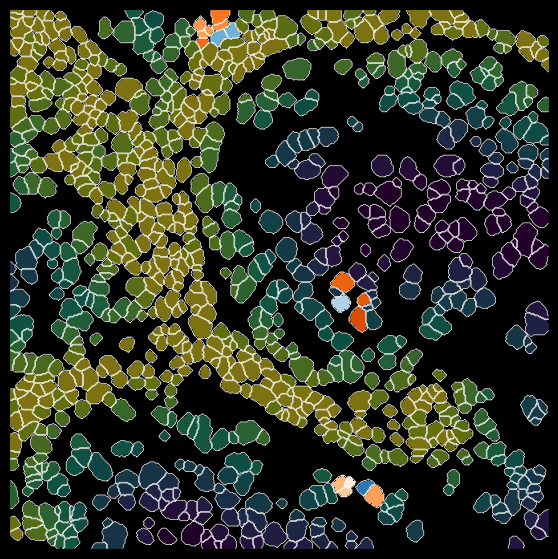

B5_2 no interactions


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/993 [00:00<?, ?it/s]

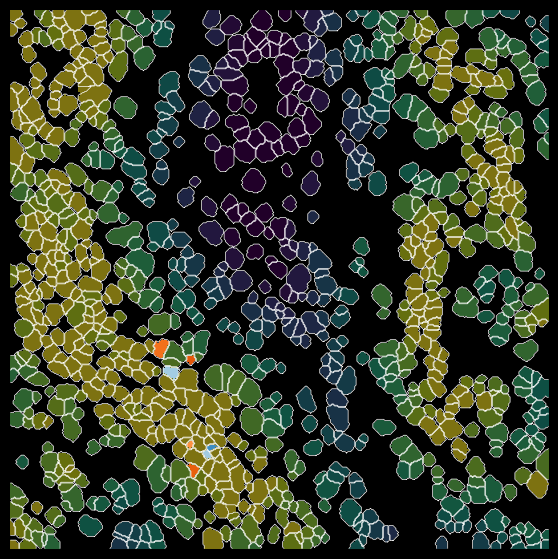

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/905 [00:00<?, ?it/s]

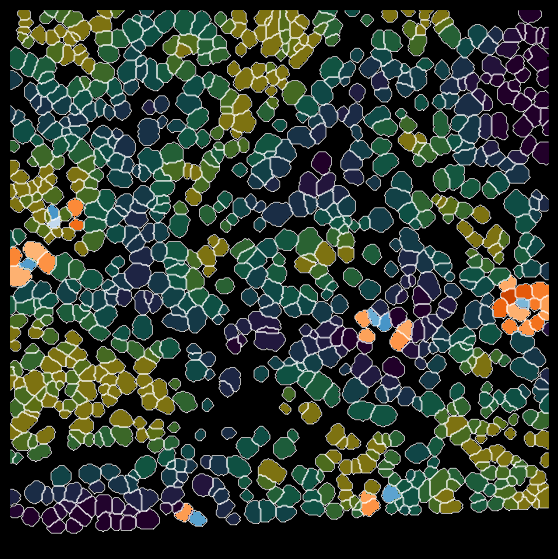

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/970 [00:00<?, ?it/s]

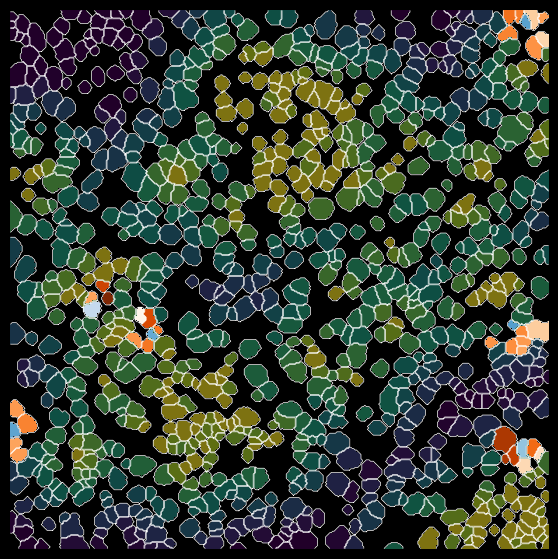

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/1282 [00:00<?, ?it/s]

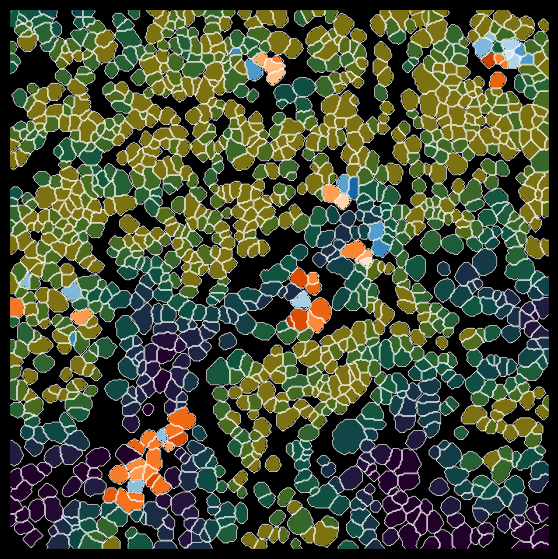

C6_4 no interactions


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/948 [00:00<?, ?it/s]

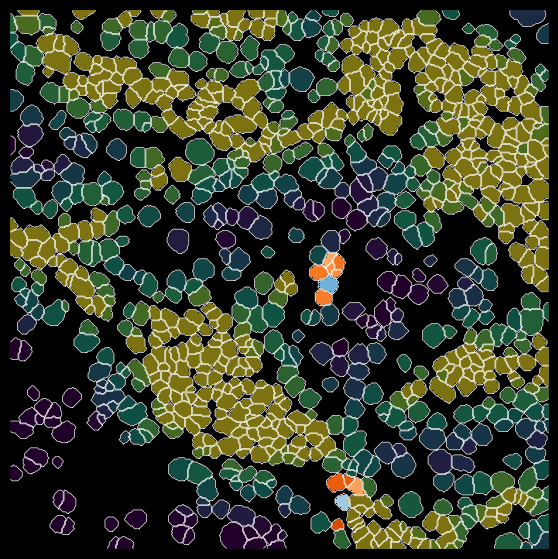

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/1117 [00:00<?, ?it/s]

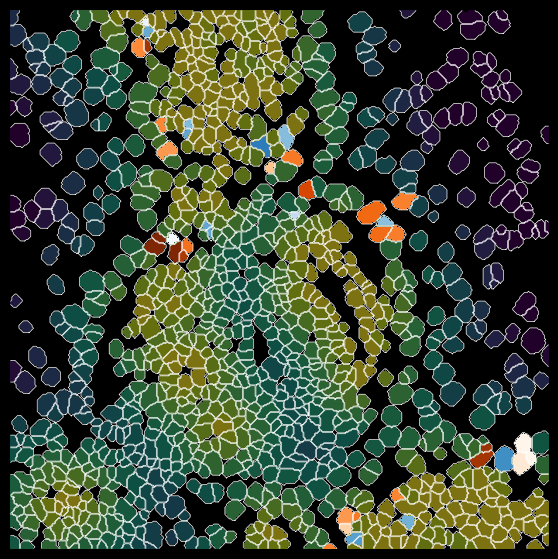

D4_3 no interactions


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/738 [00:00<?, ?it/s]

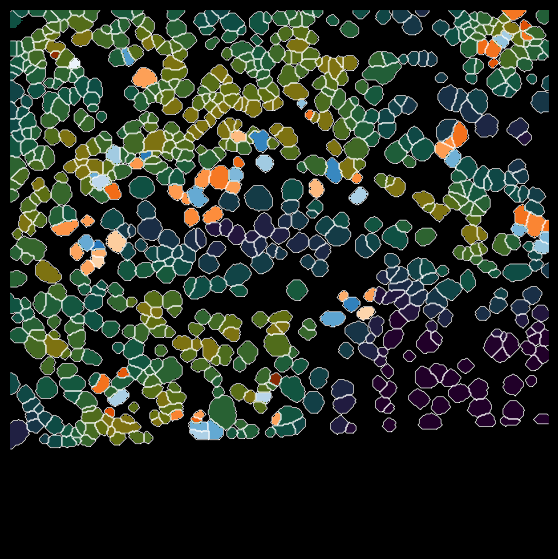

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/931 [00:00<?, ?it/s]

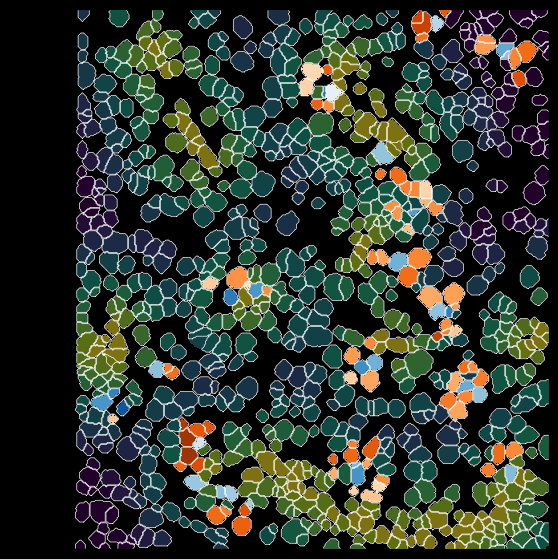

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/1293 [00:00<?, ?it/s]

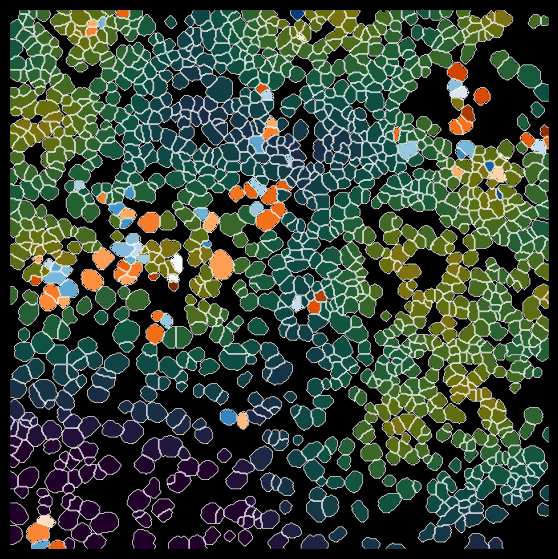

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/1209 [00:00<?, ?it/s]

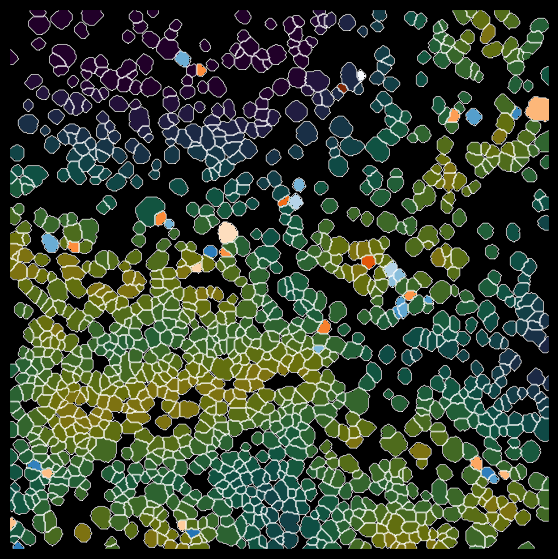

  0%|          | 0/94 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/533 [00:00<?, ?it/s]

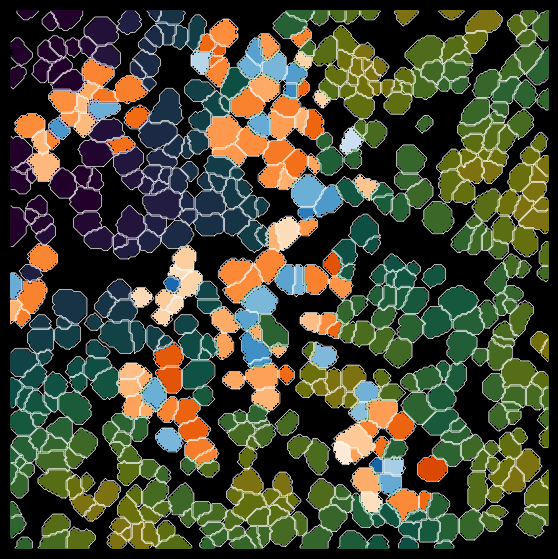

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/415 [00:00<?, ?it/s]

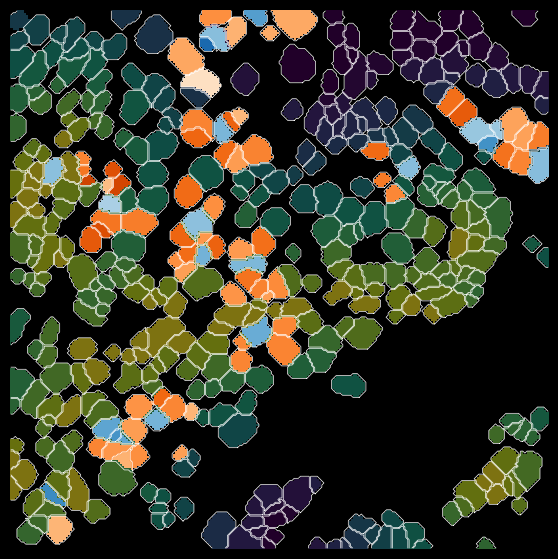

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/474 [00:00<?, ?it/s]

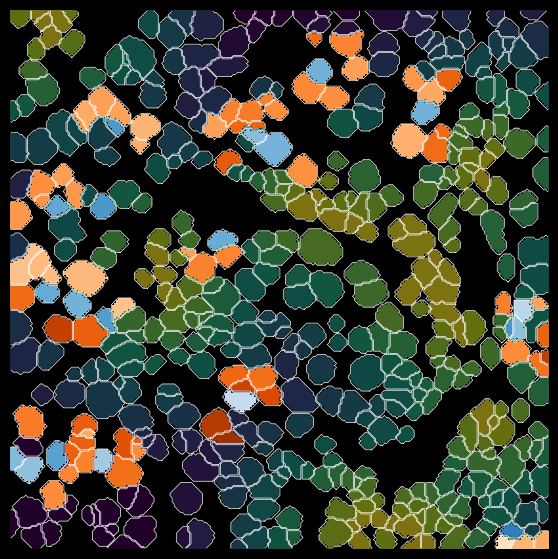

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1072 [00:00<?, ?it/s]

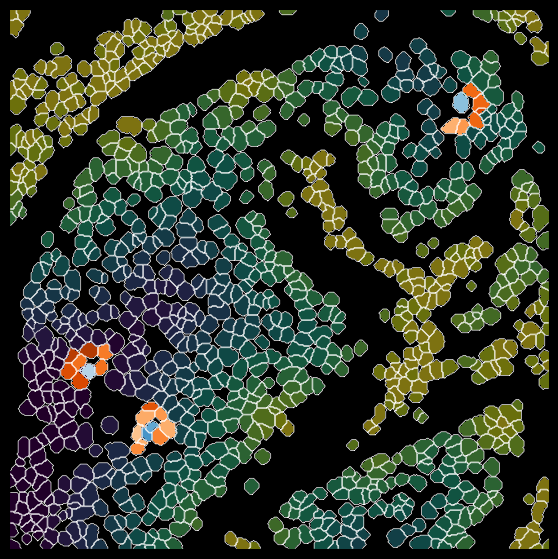

F4_2 no interactions
F4_3 no interactions


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/450 [00:00<?, ?it/s]

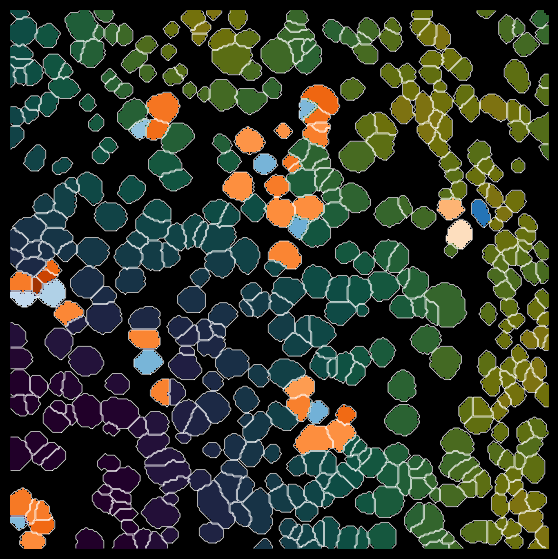

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/645 [00:00<?, ?it/s]

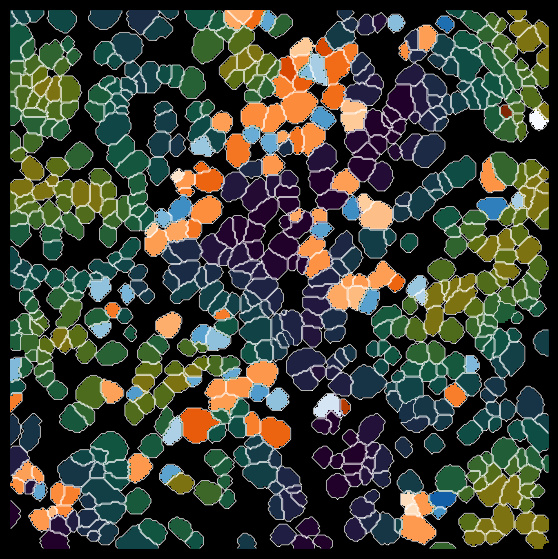

In [80]:
attr = 'Type'
interaction=('Tumor', 'CD8+')
cmap1 = 'Oranges'
cmap2 = 'Blues'
cmap_dist = 'viridis_r'

ct1_ratios = []
ct2_ratios = []
distance_ct1 = []
distance_ct2 = []

for spl in datasets:
    # Get sims 
    adata_sims_subset = adata[adata.obs.Dataset == spl]
    df_sims = pd.DataFrame(adata_sims_subset.X, columns=adata_sims_subset.var_names, index=adata_sims_subset.obs.Cell)

    # Get Graph info
    G = spadata.G[spl]['radius']
    
    # Extract cell interactions
    data = spadata.obs[spl][attr]
    node_interactions = get_node_interactions(G, data)

    # Get specific interationcs
    interactions = get_interaction_type(node_interactions, interaction)
    
    if len(interactions) == 0:
        print(f"{spl} no interactions")
        continue 
        
    # Extract cell id
    cells  = np.unique(pd.concat([interactions.source, interactions.target]))
    
    # Get ratio per cell neighbors
    group = interactions.groupby(['source_label'])
    ratios = []

    for source, df_group in group:
        group_cell = df_group.groupby(['source'])
        for cell_id, df_cell in group_cell:
            # Get metabolites count on cell vs neighbor
            nei_list = df_cell.target.tolist()
            cell_sims = df_sims.loc[cell_id]
            nei_sims = df_sims.loc[nei_list]
            ratio = cell_sims.div(nei_sims.mean() + cell_sims)
            ratios.append(pd.DataFrame(ratio, columns=[cell_id]).T)

    ratios = pd.concat(ratios)        
    assert ratios.index.duplicated().all() == False
    
    # Get mask and contour
    mask = masks["_".join([experiment, spl])]
    contours = get_contour(mask)
    

    
    # Get ratios
    cell_type1 = interactions[interactions['source_label'] == interaction[0]].source.tolist()
    ratios_ct1 = ratios.loc[cell_type1]
    cell2intensity = ratios_ct1.iloc[:, 5].to_dict()
    img1 = create_intensity_cell(mask, cell2intensity)

    cell_type2 = interactions[interactions['source_label'] == interaction[1]].source.tolist()
    ratios_ct2 = ratios.loc[cell_type2]
    cell2intensity = ratios_ct2.iloc[:, 5].to_dict()
    img2 = create_intensity_cell(mask, cell2intensity)
    
    # Get CD31 positif 
    adata_fov = adata_CN[adata_CN.obs['Dataset'] == spl]
    adata_ref = adata_fov[adata_fov[:,'CD31'].X > 0.05]

    d = get_distance(adata_fov, adata_ref)
    label2cell = {}
    cell_ids = adata_fov.obs.Cell.to_list()

    for i, cell in enumerate(cell_ids):
        label2cell[cell] = d[i]

    img = create_intensity_cell(mask, label2cell)

    # Plot
    fig, ax = plt.subplots(figsize=(7, 7), facecolor='k')
    ax.imshow(img, cmap=cmap_dist, vmax=np.nanquantile(img, 0.95), alpha=0.5)
    ax.axis("off")
    ax.imshow(img1, cmap=cmap1, vmin=0.45, vmax=0.55)
    ax.imshow(img2, cmap=cmap2, vmin=0.45, vmax=0.55)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    plt.show()
    
    # Add info to ratios
    ct1_ratios.append(ratios_ct1)
    ct2_ratios.append(ratios_ct2)
    distance_ct1.append(np.array([label2cell[c] for c in cell_type1]).flatten())
    distance_ct2.append(np.array([label2cell[c] for c in cell_type1]).flatten())

In [81]:
# Summary plot
ct1_ratio = pd.concat(ct1_ratios)
ct2_ratio = pd.concat(ct2_ratios)
dist_ct1 = np.concatenate(distance_ct1)
dist_ct2 = np.concatenate(distance_ct2)

ct1_ratio['Distance CD31'] = dist_ct1
ct2_ratio['Distance CD31'] = dist_ct2

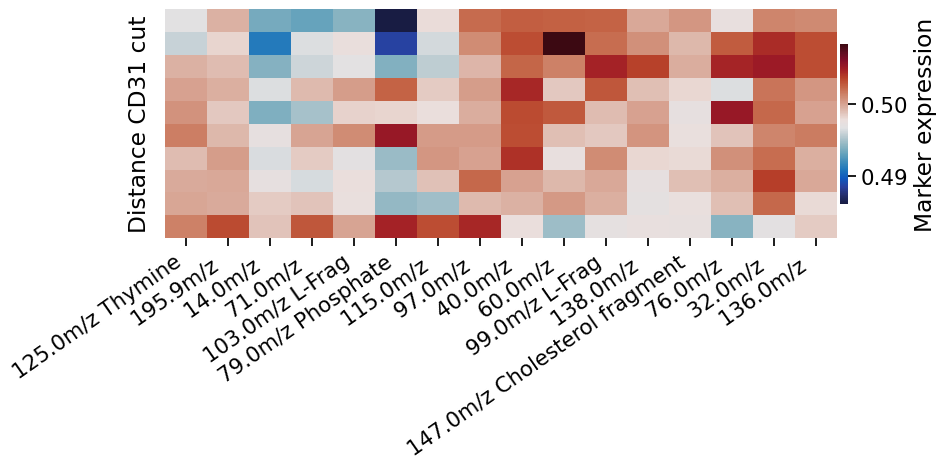

In [101]:
df = ct1_ratio
df_corr = df.corr()

n = 8
marker = 'Distance CD31'
n_cut = 10

# Get positive and negative correlation
corr_pos = df_corr.loc[marker].nlargest(25).index.tolist()
corr_neg = df_corr.loc[marker].nsmallest(25).index.tolist()

# Get only SIMS masses
corr_pos = [corr for corr in corr_pos if corr in SIMS_nm_subset][:n]
corr_neg = [corr for corr in corr_neg if corr in SIMS_nm_subset][:n]
corr_list = [marker] + corr_pos + corr_neg

# Get range 
df_intensity = df[corr_list]
df_intensity.sort_values(by=[marker], inplace=True)
df_intensity[f'{marker} cut'] = pd.qcut(df_intensity[marker], n_cut, duplicates='drop') 

LE = LabelEncoder()
df_intensity[f'{marker} cut'] = LE.fit_transform(df_intensity[f'{marker} cut'])

# Sort by Distance
df_sort = df_intensity.groupby(f'{marker} cut').mean()
df_sort = df_sort.drop([marker], axis=1)

# Plot
with sns.plotting_context('notebook', font_scale=1.4):
    fig, ax = plt.subplots(figsize=(10,5))
    ax = sns.heatmap(df_sort, ax=ax, cmap=heatmap_cmp,
                     xticklabels=True, yticklabels=False, 
                     cbar_kws={"label": "Marker expression", "pad": 0.004, "shrink": 0.7})
    plt.xticks(rotation = 35, ha='right')
    plt.tight_layout()
    plt.show()

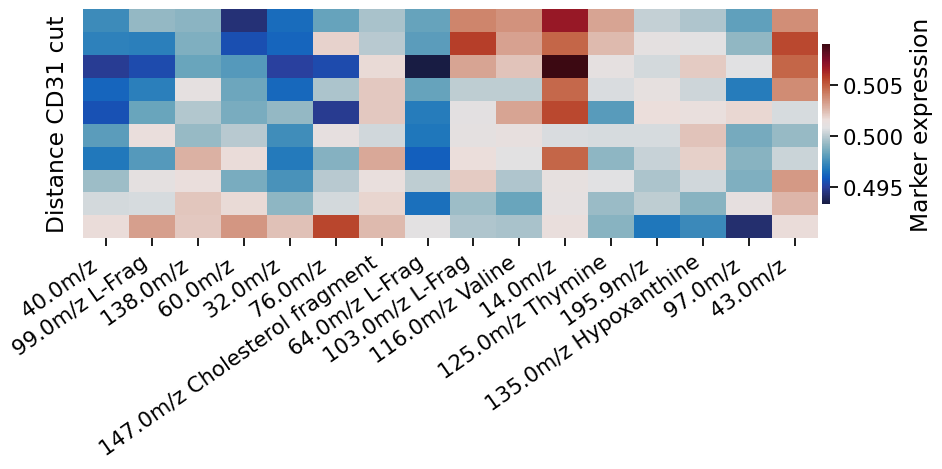

In [102]:
df = ct2_ratio
df_corr = df.corr()

n = 8
marker = 'Distance CD31'
n_cut = 10

# Get positive and negative correlation
corr_pos = df_corr.loc[marker].nlargest(25).index.tolist()
corr_neg = df_corr.loc[marker].nsmallest(25).index.tolist()

# Get only SIMS masses
corr_pos = [corr for corr in corr_pos if corr in SIMS_nm_subset][:n]
corr_neg = [corr for corr in corr_neg if corr in SIMS_nm_subset][:n]
corr_list = [marker] + corr_pos + corr_neg

# Get range 
df_intensity = df[corr_list]
df_intensity.sort_values(by=[marker], inplace=True)
df_intensity[f'{marker} cut'] = pd.qcut(df_intensity[marker], n_cut, duplicates='drop') 

LE = LabelEncoder()
df_intensity[f'{marker} cut'] = LE.fit_transform(df_intensity[f'{marker} cut'])

# Sort by Distance
df_sort = df_intensity.groupby(f'{marker} cut').mean()
df_sort = df_sort.drop([marker], axis=1)

# Plot
with sns.plotting_context('notebook', font_scale=1.4):
    fig, ax = plt.subplots(figsize=(10,5))
    ax = sns.heatmap(df_sort, ax=ax, cmap=heatmap_cmp,
                     xticklabels=True, yticklabels=False, 
                     cbar_kws={"label": "Marker expression", "pad": 0.004, "shrink": 0.7})
    plt.xticks(rotation = 35, ha='right')
    plt.tight_layout()
    plt.show()

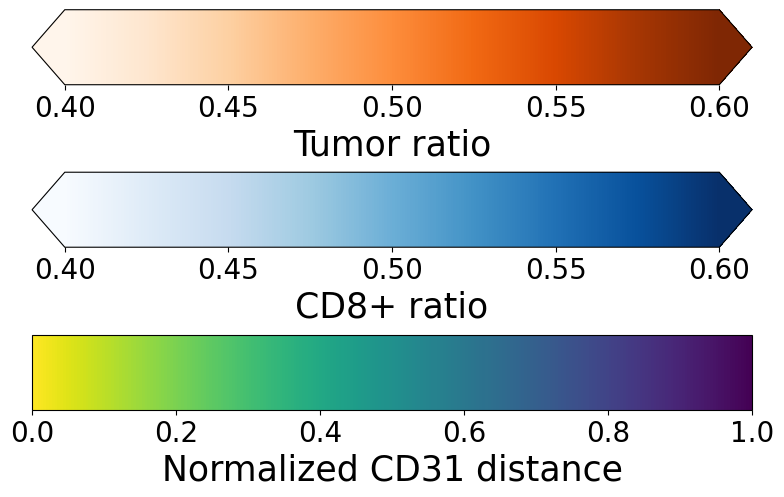

In [53]:
import matplotlib.pyplot as plt
import matplotlib as mpl
plt.rcParams.update({'font.size':20})

# Make a figure and axes with dimensions as desired.
fig = plt.figure(figsize=(8, 5))
ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])
ax2 = fig.add_axes([0.05, 0.475, 0.9, 0.15])
ax3 = fig.add_axes([0.05, 0.15, 0.9, 0.15])

norm = mpl.colors.Normalize(vmin=0.4, vmax=0.6)

# Fist Cell type
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap1,
                                norm=norm, extend='both',
                                orientation='horizontal')
cb1.set_label(f'{interaction[0]} ratio', fontsize=25)

# 2nd Cell type
cb2 = mpl.colorbar.ColorbarBase(ax2, cmap=cmap2,
                                norm=norm, extend='both',
                                orientation='horizontal')
cb2.set_label(f'{interaction[1]} ratio', fontsize=25)

# Distance map
norm = mpl.colors.Normalize(vmin=0, vmax=1)

cb3 = mpl.colorbar.ColorbarBase(ax3, cmap=cmap_dist,
                                norm=norm,
                                orientation='horizontal')
cb3.set_label(f'Normalized CD31 distance', fontsize=25)